In [1]:
# default_exp experiment_3
%load_ext autoreload
%autoreload 2

## Experiment 3: Optimise the Font for Legibility Under Impaired Viewing Conditions (50% Accuracy)

### Variations Created

See Section 6.

## Imports

In [2]:


from aifont.core import *
from aifont.ocrlearner import *
from aifont.fontlearner import *
from aifont.fontsampler import *
from fastai.data.all import *
from fastai.vision.all import *
from enum import Enum, auto
import gc
from nbdev.showdoc import *
import matplotlib.pyplot as plt
# import os
import pandas as pd
from pandas import DataFrame
# import PIL
# import random
# import re
# import scipy.io
# import string
# import torchvision.transforms.functional as VF
# import torchvision.transforms as VT
from typing import Callable, List, Sequence, Tuple

## Common Variables and Functions

### Constants

In [3]:
DUMP_FOLDER = Path("results/03_experiment_3"); ensure_path(DUMP_FOLDER)
FINETUNED_OCR_MODEL_FN     = "e2_cornet_z_v4_finetuned_final.pth" # The default model
FINETUNED_OCR_MODEL_ALT_FN = "e2_cornet_z_v1_finetuned_final.pth" # NB. v here refers to version, not visual stream layer
NONFINETUNED_OCR_MODEL_FN  = "e2_cornet_z_v1_final.pth"
ACC_50_TFMS = {'use_affine_tfms': False,
               'use_xtra_tfms': True,
               'tfms_p': 1.0,
               'blur_size': None,
               'blur_sigma': None,
               'noise_f': 1.365625,
               'noise_type': NoiseType.GAUSSIAN,
               'noise_method': BlendingMethod.ADD,
               'size': 48,
               'normalize': True,
               'translate_and_pad': 0.0
              }
NO_TFMS  = {'use_affine_tfms': False,
            'use_xtra_tfms': False,
            'tfms_p': 0.,
            'blur_size': None,
            'blur_sigma': None,
            'noise_f': None,
            'noise_type': None, 
            'noise_method': None,
            'size': 48,
            'normalize': True,
            'translate_and_pad': 0.0
            }
BASE_FN = "e3_with_e2"
BASE_ALT_FN = "e3_with_e2_alt"
BEST_PARAMS_PATH = DUMP_FOLDER/f"{BASE_FN}_best_params.pkl"
BEST_PARAMS_ALT_PATH = DUMP_FOLDER/f"{BASE_ALT_FN}_best_params.pkl"
ARIAL_BOLD_PARAMS_PATH = DUMP_FOLDER/f"{BASE_FN}_arial_bold_params.pkl"
BEST_VARIANT_PARAMS_PATH = DUMP_FOLDER/"e3_best_variant_params.pkl"

### Optimisation Functions

In [4]:
def get_variations_filepath(
    fn_suffix: str,
    base_fn = BASE_FN,
    all_suffix = True,
) -> Path:
    """Get the path to the variations file."""
    f = f"{base_fn}_{fn_suffix}"
    if all_suffix: f = f"{f}_all"
    return DUMP_FOLDER / f

def get_learner(
    ocr_fn = FINETUNED_OCR_MODEL_FN,
    ocr_arch = cornet_for_ocr,
    n_out = 26,
    seed = None,
    bs = 26*3,
    tfms = ACC_50_TFMS,
    init_range = 2.,
    param_specs = FONT_MATCHING_PARAM_SPECS,
    **kwargs
) -> VectorLearner:
    assert tfms is not None and "size" in tfms
    gc.collect()
    ocr_model = load_ocr_model(file=ocr_fn, arch=ocr_arch, n_out=n_out)
    # These must match ACC_50_TFMS
    ocr_tfms = [Pad((tfms["size"] - 28) // 2, fill=1.)]
    if "noise_f" in tfms and tfms["noise_f"]: # Check for None and > 0.
        ocr_tfms += [Noise(p=tfms["tfms_p"], f=tfms["noise_f"], method=tfms["noise_method"], noise_type=tfms["noise_type"])]
    if "translate_and_pad" in tfms and tfms["translate_and_pad"]:
        ocr_tfms += [TranslateAndPad(p=tfms["tfms_p"], max_x=tfms["translate_and_pad"], max_y=tfms["translate_and_pad"])]
    if "blur_sigma" in tfms and tfms["blur_sigma"]:
        ocr_tfms += [GaussianBlur(p=tfms["tfms_p"], sigma=tfms["blur_sigma"], kernel_size=(tfms["blur_size"],)*2)]
    ocr_tfms += [ToRGB(), 
                 get_imagenet_norm()]
    learner = create_font_learner(ocr_tfms=ocr_tfms if len(ocr_tfms) else None,
                                  letters=None,
                                  ocr_model=ocr_model,
                                  n_colors_out=1,
                                  lr=1e-1, 
                                  init_range=init_range,
                                  seed=seed,
                                  bs=bs,
                                  param_specs=param_specs,
                                  **kwargs
                                  )
    assert len(learner.loss_func.ocr_loss.tfms) == len(ocr_tfms)
    return learner

@delegates(get_learner)
def fancy_fit_ocr_variations(
    ocr_fn = FINETUNED_OCR_MODEL_FN,
    fn_suffix = "",
    base_fn = BASE_FN,
    variations = 20,
    overwrite = False,
    dump_folder = DUMP_FOLDER,
    min_width = None,
    min_height = None,
    show_sample = False,
    max_init_loss = 4.,
    frozen_params: dict = None,
    init_params: Union[dict, list[dict]] = None,
    perturb_init_params = None,
    runs = None,
    **kwargs
    ) -> list[dict]:
    """Create variations using `fancy_fit_ocr`."""
    path = get_variations_filepath(fn_suffix, all_suffix=False)
    results = []
    for k in range(variations):
        var_fp = f"{path}_{k}.pkl"
        if not overwrite and os.path.exists(var_fp):
            print(f"Loading variation {k + 1}/{variations} from file {var_fp}")
            results.append(load(var_fp))
            continue
        gc.collect()
        self = get_learner(ocr_fn=ocr_fn, **kwargs)
        if init_params is None: 
            self.reset_parameters()
            init_params_k = None
        else: 
            init_params_k = init_params if type(init_params) is dict else init_params[k % len(init_params)]
            self.load_param_dict(init_params_k)
        if show_sample: display(self.render_letters(apply_tfms=True))
        pars = self.get_param_dict()
        loss = self.get_current_loss()
        report(f"Starting variation {k + 1}/{variations}")
        with self.no_progress(): 
            var_res = fancy_fit_ocr(
                self, 
                msg=f"Variation {k + 1}/{variations} • ",
                min_width=min_width,
                min_height=min_height,
                max_init_loss=max_init_loss,
                frozen_params=frozen_params,
                init_params=init_params_k,
                perturb_init_params=perturb_init_params,
                runs=runs,
                )
        res = {
            "initial_params": pars,
            "final_params":   var_res[-1]["params"],
            "init_loss":      loss,
            "final_loss":     var_res[-1]["loss"],
            "full_res":       var_res,
            "img":            self.render_letters(),
            "img_with_tfms":  self.render_letters(apply_tfms=True)
            }
        dump(res, var_fp)
        results.append(res)
    dump(results, f"{path}_all.pkl")
    return results

def get_match_font_learner(seed = 42, 
    font_fn = "Arial Bold.ttf",
    font_size = 1.,
    font_y = 24/28,
    samples=3, # We don't care so much about noise here
    **kwargs
    ) -> VectorLearner:
    gc.collect()
    learner = create_font_learner(loss_type=LossType.MATCH_FONT,
                                  match_font_path=SYS_FONT_PATH/font_fn,
                                  match_font_size=font_size,
                                  match_font_y=font_y,
                                  n_colors_out=1,
                                  lr=1e-2, 
                                  init_range=0., # Init from 0. but set height larger below
                                  seed=seed,
                                  samples=samples,
                                  **kwargs)
    return learner

def fancy_fit_ocr(
    learner: VectorLearner,
    runs: list[list[float]] = None,
    max_init_loss = 4., # This is crucial because losses of more than 3.5 don't seem to converge
    max_reinits = 100,  # N/A
    min_width = None,
    min_height = None,
    frozen_params: dict = None,
    init_params: dict = None,
    perturb_init_params = None, # If using init_params, they are perturbed by +- this amount
    msg = ""
    ) -> list[dict]:
    """Perform multiple fitting runs."""
    if runs is None: runs = [[400, 1.],
                             [150, .5],
                             [150, .2]]
    res = []
    orig_loss = learner.get_current_loss()
    if init_params is not None and max_init_loss is not None: 
        warn("Consider setting max_init_loss to None when using init_params")
    def _prepare(learner):
        if min_width is not None:
            for p in learner.param_names:
                if p.startswith("Width") and learner.get_param(p) < min_width: learner.set_param(p, min_width)
        if min_height is not None:
            if learner.get_param("Height") < min_height: learner.set_param("Height", min_height)
        if frozen_params is not None:
            for k, v in frozen_params.items(): learner.set_param(k, v)
            learner.freeze_params(list(frozen_params.keys()))
        if init_params is not None: 
            if perturb_init_params is not None:
                for k, v in init_params.items(): 
                    learner.set_param(k, v + random.uniform(-perturb_init_params, perturb_init_params))
            else: learner.load_param_dict(init_params)
    _prepare(learner)
    if max_init_loss is not None:
        j = 0
        while orig_loss > max_init_loss:
            if j >= max_reinits: 
                report("Max reinits exceeded")
                return [dict(lr=None,
                        loss=orig_loss,
                        params=learner.get_param_dict(),
                        note="Max reinits exceeded")]
            j += 1
            learner.reset_parameters()
            _prepare(learner)
            orig_loss = learner.get_current_loss()
    # best_fn = f"nb17_tmp_fancy_fit_ocr_best"
    # save_cb = SaveModelCallback(fname=best_fn, with_opt=False)
    for epochs,lr in runs:
        report(f"{msg} run • lr {lr} • epochs {epochs}")
        # if auto_lr is not None: lr = getattr(learner.lr_find(suggest_funcs=(minimum, steep, valley, slide), show_plot=False), 
        #                                      auto_lr, lr)
        learner.fit(epochs, lr)
        res.append(dict(lr=lr,
                        epochs=epochs,
                        loss=learner.recorder.losses[-1],
                        params=learner.get_param_dict()))
    clear()
    return res

@delegates(get_learner)
def recalculate_losses(
    variations: list[dict],
    ocr_fn = FINETUNED_OCR_MODEL_FN,
    bs = 26 * 3,
    iters=5,
    incl_loss=True,
    incl_per_category=True,
    param_col="final_params",
    loss_col="final_loss",
    cat_loss_col="per_category_loss",
    **kwargs
) -> None:
    """Recalculate the final losses for the variations."""
    assert incl_loss or incl_per_category
    gc.collect()
    learn = get_learner(ocr_fn=ocr_fn, bs=bs, **kwargs)
    for r in variations:
        print(f"Recalculating loss for variation {variations.index(r)+1} of {len(variations)}...")
        learn.load_param_dict(r[param_col])
        if incl_loss:         r[loss_col] = learn.get_current_loss(iters=iters)
        if incl_per_category: r[cat_loss_col] = learn.get_current_loss(iters=iters, per_category=True)

### Parameter Merging From Variations

In [5]:


def find_best_variation_per_category(
    vars: list[dict],
    cat_loss_col="per_category_loss",
) -> dict:
    """Find the best variations for each letter category."""
    losses = {k:[] for k in vars[0][cat_loss_col].keys()}
    for o in vars:
        for k,v in o[cat_loss_col].items(): losses[k].append(v)
    mins = {k:min(v)  for k,v in losses.items()}
    out = {}
    for k,v in mins.items():
        for o in vars:
            if o[cat_loss_col][k] == v:
                out[k] = o; break
    return out

def filter_best_variations(
    compare_to: dict,
    best_vars: dict,
    min_improvement=.1,
    cat_loss_col="per_category_loss",
) -> dict:
    """Filter the dict produced by `find_best_variation_per_category` to only
       include letters where improvement to `compared_to` exceeds `min_improvement`."""
    out = {}
    for k,v in best_vars.items():
        if compare_to[cat_loss_col][k] - v[cat_loss_col][k] >= min_improvement:
            out[k] = v
    return out
    
def merge_best_parameters(
    vars: list[dict],
    base_idx=0,
    min_improvement=.1,
    vocal=True,
    param_col="final_params",
    cat_loss_col="per_category_loss",
) -> dict:
    """Merge the best parameters for each letter to params of variation at `base_idx`
       and return a param_dict."""
    base = vars[base_idx]
    out = {**base[param_col]}
    best_vars = find_best_variation_per_category(vars, cat_loss_col=cat_loss_col)
    best_vars = filter_best_variations(base, best_vars, min_improvement=min_improvement, cat_loss_col=cat_loss_col)
    # Only select params that do not affect other letters
    affected_params = [o for o in base[param_col].keys() if \
                       param_affects(o, best_vars.keys(), strict=True, incl_general=False)]
    for p in affected_params:
        # Get a mean over the best params for each of the affected letters
        v = mean([best_vars[o][param_col][p] for o in get_param_letters(p)])
        if vocal: print(f"Change '{p}' from {out[p]:.4} => {v:.4}")
        out[p] = v
    return out

### Visualisation Functions

In [6]:
def show_variation_renders(
    variations: Union[list[dict], DataFrame],
    n = 12,
    n_cols = 4,
    fig_width = 14,
    incl_tfms = False,
    learner: VectorLearner = None,
    rerender = False,
    sort_by_loss = True,
    title_sfx = "",
    loss_col = "final_loss",
    param_col = "final_params",
    label_col: str = None,
    dpi = 72,
    show_title = True,
) -> plt.Figure:
    """Show the rendered images together with losses, possibly paired with loss-function-transformed images."""
    assert all([o in variations[0] for o in (loss_col, param_col)])
    if incl_tfms and "img_with_tfms" not in variations[0]:
        assert learner is not None, "You must supply a learner if incl_tfms is True and variations don't contain img_with_tfms."
    assert not rerender or learner, "You must supply a learner if rerender is True"
    if type(variations) is list: variations = DataFrame(variations)
    if sort_by_loss: variations = variations.sort_values(by=loss_col).reset_index()
    n_imgs = n if n is not None and len(variations) > n else len(variations)
    if incl_tfms: n_imgs *= 2
    n_rows = math.ceil(n_imgs / n_cols)
    if rerender: 
        img_ratio = learner.canvas_height / learner.canvas_width
    else: 
        _img = variations.iloc[0].img
        img_ratio = _img.height / _img.width
    fig_height = (fig_width / n_cols * img_ratio + .5) * n_rows
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height), dpi=dpi)
    axs = axs.flatten()
    def _do_rend(v, apply_tfms=False):
        return learner.load_param_dict(v[param_col]).render_letters(apply_tfms=apply_tfms)
    for i, ax in enumerate(axs):
        if i >= n_imgs: break
        is_tfmd = incl_tfms and i % 2 == 1
        v = variations.iloc[i//2 if incl_tfms else i]
        if is_tfmd: img = v.img_with_tfms if not rerender and "img_with_tfms" in v else _do_rend(v, True)
        else:       img = v.img if not rerender or ("no_rerender" in v and v.no_rerender is True) else _do_rend(v)
        ax.imshow(img)
        ax.set_axis_off()
        ax.set_title( "With loss tfms"          if is_tfmd else
                     (f"Loss {v[loss_col]:.4f}" if label_col is None else v[label_col]))
    clear()
    title = "Rendered fonts"
    if label_col is None: title += "and losses"
    title += title_sfx
    if incl_tfms: title += "\nwith examples of loss-function-transformed images\n(Note that true transforms may be randomised)"
    if show_title: fig.suptitle(title)
    plt.show(True)
    return fig

def plot_per_category_losses(
    vars: list[dict],
    figsize = (18, 6),
    plot_top_n: int = None,
    plot_idx: list[int] = None,
    plot_rest = False,
    lim: float = None,
    deltas_from_mean = True,
    loss_col="final_loss",
    cat_loss_col="per_category_loss",
) -> None:
    """Plot the per category losses from `recalculate_losses`.
       Use `plot_top_n` or `plot_idx` to only plot some of the
       variations while using all of them to calculate means.
       Set `plot_rest` to True to plot the excluded variations
       in the background."""
    assert plot_top_n is None or plot_idx is None
    if plot_top_n is None or plot_top_n > len(vars): plot_top_n = len(vars)
    fig = plt.figure(figsize=figsize)
    ax  = plt.gca()
    if lim is not None: ax.set_xlim(0, lim); ax.set_ylim(0, lim)
    losses = {k:[] for k in vars[0][cat_loss_col].keys()}
    x = ["mean"] + list(losses.keys())
    for o in vars:
        for k,v in o[cat_loss_col].items(): losses[k].append(v)
    means = {k:mean(v) for k,v in losses.items()}
    mins =  {k:min(v)  for k,v in losses.items()}
    avg_mean = mean([o[loss_col] for o in vars])
    avg_min  = min([o[loss_col] for o in vars])
    if deltas_from_mean: ax.axhline(y=0., linestyle='dotted')
    ax.plot(x, 
            [avg_min - avg_mean] + [mi - me for mi,me in zip(mins.values(), means.values())] if deltas_from_mean \
            else [avg_min] + list(mins.values()),
            label="Minima",
            linestyle='dashed')
    for i,o in enumerate(sorted(vars, key=lambda o: o[loss_col])):
        bg = False
        if (plot_top_n is not None and i >= plot_top_n) or \
           (plot_idx is not None and i not in plot_idx):
            if plot_rest: bg = True
            else: continue
        ll = o[cat_loss_col]
        ax.plot(x,
                [o[loss_col] - avg_mean] + [v - means[k] for k,v in ll.items()] if deltas_from_mean \
                else [o[loss_col]] + list(ll.values()),
                label=None if bg else f"{i}: loss {o[loss_col]:.4}",
                color="#00000022" if bg else None)
    if plot_top_n <= 10 or plot_idx is not None: ax.legend()
    plt.suptitle(f"Losses per category (best {plot_top_n} of {len(vars)})")
    plt.xlabel(f"Category"), plt.ylabel(f"Loss (diff from category mean)")

def plot_parameter_values(
    vars: list[dict],
    figsize = (18, 6),
    plot_top_n: int = None,
    plot_idx: list[int] = None,
    plot_rest = False,
    param_col = "final_params",
    loss_col = "final_loss",
) -> None:
    """Plot the interpolated parameter values.
       Use `plot_top_n` or `plot_idx` to only plot some of the
       variations while using all of them to calculate means.
       Set `plot_rest` to True to plot the excluded variations
       in the background."""
    assert plot_top_n is None or plot_idx is None
    if plot_top_n is None or plot_top_n > len(vars): plot_top_n = len(vars)
    fig = plt.figure(figsize=figsize)
    ax  = plt.gca()
    # ax.set_ylim(0, 1)
    # Get interpolated values
    param_values = []
    learn = get_learner(param_specs=FONT_MATCHING_PARAM_SPECS)
    clear()
    for o in vars:
        p_vals = {}
        p_dict = o[param_col]
        learn.load_param_dict(p_dict)
        for p in p_dict.keys(): p_vals[p] = learn.get_param_value(p).item()
        param_values.append(p_vals)
    p_names = list(param_values[0].keys())
    means = [mean([o[p] for o in param_values]) for p in p_names]
    ax.plot(p_names, 
            means,
            label="Mean",
            linestyle='dashed')
    for i,o in enumerate(param_values):
        bg = False
        if (plot_top_n is not None and i >= plot_top_n) or \
           (plot_idx is not None and i not in plot_idx):
            if plot_rest: bg = True
            else: continue
        ax.plot(p_names,
                o.values(),
                label=None if bg else f"{i}: loss {vars[i][loss_col]:.4}",
                color="#00000022" if bg else None)
    if plot_top_n <= 10 or plot_idx is not None: ax.legend()
    plt.xticks(rotation=90)
    plt.suptitle(f"Interpolated parameter values (best {plot_top_n} of {len(vars)})")
    plt.xlabel(f"Parameter"), plt.ylabel(f"Interpolated value")

def plot_multiple_sets_parameter_values(
    sets: DataFrame,
    figsize = (18, 6),
    plot_top_n = 5,
    param_col = "final_params",
    loss_col = "final_loss",
    results_df_col = "Results",
    label_df_col = "Label",
    plot_ranges = False,
    range_std = True,
    sort_ranges = False,
    y_range = None,
) -> None:
    """Plot the normalised parameter values. Pass either a
       variations list or a `DataFrame` of multiple lists.
       Use `plot_top_n` or `plot_idx` to only plot some of the
       variations while using all of them to calculate means.
       Set `plot_rest` to True to plot the excluded variations
       in the background."""
    fig = plt.figure(figsize=figsize)
    ax  = plt.gca()
    cmap = plt.cm.get_cmap("jet", max(5, len(sets)))
    param_specs = FONT_MATCHING_PARAM_SPECS
    learn = get_learner(param_specs=param_specs)
    p_names = list(learn.get_param_dict().keys())
    all_values = []
    for i,row in sets.iterrows():
        vars = sorted(row[results_df_col], key=lambda o: o[loss_col])
        # Get interpolated values and normalise them
        param_values = []
        for j,o in enumerate(vars):
            if plot_top_n and j >= plot_top_n: break
            p_vals = {}
            p_dict = o[param_col]
            learn.load_param_dict(p_dict)
            for p in p_dict.keys(): 
                p_i = param_specs[p]
                v = learn.get_param_value(p).item()
                v = (v - p_i.min) / (p_i.max - p_i.min)
                p_vals[p] = v
            param_values.append(p_vals)
        if plot_ranges:
            all_values += param_values; continue
        for j,o in enumerate(param_values):
            ax.scatter(p_names,
                       o.values(),
                       label=row[label_df_col] if j == 0 else None,
                       color=cmap(i))
    if plot_ranges:
        all_values = np.array([list(o.values()) for o in all_values])
        ranges = all_values.std(axis=0) if range_std else all_values.max(axis=0) - all_values.min(axis=0)
        names_and_ranges = list(zip(p_names, ranges))
        if sort_ranges: names_and_ranges.sort(key=lambda o: o[1])
        ax.bar(*list(zip(*names_and_ranges))
)
    else: ax.legend()
    clear()
    if y_range is not None: ax.set_ylim(y_range)
    plt.xticks(rotation=90)
    title = f"{'Std' if range_std else 'Spread'} of normalised parameter values for max top {plot_top_n} variations of each set" if plot_ranges else \
            f"Normalised parameter values for max top {plot_top_n} variations of each set" 
    title += "\n(" + " • ".join([o[label_df_col] for _,o in sets.iterrows()]) + ")"
    plt.suptitle(title)
    plt.xlabel(f"Parameter"), plt.ylabel(f"Normalised value")

### All-in-One Optimisation Function

In [7]:
def create_and_optimise_variations(
    fn_suffix: str,
    ocr_fn = FINETUNED_OCR_MODEL_FN,
    variations = 5,
    init_res: list[dict] = None,
    param_col = "initial_params",
    tfms = ACC_50_TFMS,
    **kwargs,
) -> list[dict]:
    """Create variations and finetune them and add a merged one.
       Possibly start from the parameters `init_res`."""
    learner_args = dict(
        ocr_fn=ocr_fn,
        tfms=tfms,
    )
    fp = get_variations_filepath(fn_suffix)
    res = try_load(fp)
    if res is not None:
        print(f"Found results in {fp}")
    else:
        res = fancy_fit_ocr_variations(fn_suffix=fn_suffix,
                                    variations=variations,
                                    min_width=.5, # Let's add this to get rid of possible cul-de-sacs
                                    min_height=.5, # Let's add this to get rid of possible cul-de-sacs
                                    show_sample=False,
                                    init_params=[o[param_col] for o in init_res] if init_res else None,
                                    **learner_args,
                                    **kwargs,
                                    )
    recalculate_losses(res, iters=5, **learner_args)
    res.sort(key=lambda o:o["final_loss"])
    dump(res, fp)
    merged_params = merge_best_parameters(res, min_improvement=.1)
    learn = None; gc.collect()
    learn = get_learner(**learner_args)
    learn.load_param_dict(merged_params)
    l1 = res[0]["final_loss"]
    l2 = learn.get_current_loss(10)
    clear()
    loss_d = l1 - l2
    msg = f"Merge loss improvement: {loss_d:.4} • {l1:.4} => {l2:.4}"
    learn.fit_one_cycle(100, .02)
    l3 = learn.get_current_loss(10)
    clear()
    loss_d2 = l2 - l3
    msg += "\n" + f"Merge loss improvement after finetuning: {loss_d2:.4} • {l2:.4} => {l3:.4}"
    best_res = dict(final_params = learn.get_param_dict())
    recalculate_losses([best_res], incl_loss=True, iters=5, **learner_args)
    clear()
    res = [best_res] + res
    dump(res, fp)
    print(msg)
    return res

### Accuracy Comparison

In [8]:
def compare_accuracies(
    vars: list[dict],
    ocr_fns = {"V1 not finetuned": NONFINETUNED_OCR_MODEL_FN, 
               "V1 finetuned":     FINETUNED_OCR_MODEL_ALT_FN, 
               "V4 finetuned":     FINETUNED_OCR_MODEL_FN },
    tfms = ACC_50_TFMS,
    font_size = 1.5, # For Arial
    font_y = 25/28,  # For Arial
    iters = 100, 
    param_col = "final_params",
    label_col = "label",
    show_batch = False,
) -> Tuple[Image.Image, DataFrame]:
    """Perform accuracy comparisons between AI Font and existing fonts.
       Returns a `DataFrame` containing for each entry a `list` of
       mean propability, per-class propabilities, mean accuracy and 
       per-class accuracies."""
    # 1. Create DataFrames
    dfs = OrderedDict()
    dfs["Arial Regular"] = get_font_df(font_size=font_size, font_y=font_y)
    dfs["Arial Bold"]    = get_font_df([SYS_FONT_PATH/"Arial Bold.ttf"], font_size=font_size, font_y=font_y)
    learn = None; gc.collect()
    learn = get_learner()
    for i,var in enumerate(vars):
        learn.load_param_dict(var[param_col])
        dfs[f"AI Font: {var[label_col] if label_col in var else i}"]  = learn.render_letters_as_df()
    clear()
    df_images = image_grid([df_to_image_grid(o) for o in dfs.values()], cols=4)
    # 2. Perform comparisons
    accs = OrderedDict()
    for ocr_lbl,ocr_fn in ocr_fns.items():
        acc_args = dict(iters=iters, 
                        splitter=cornet_splitter,
                        show_batch=show_batch,
                        **tfms)
        ocr_model = load_ocr_model(file=ocr_fn, arch=cornet_for_ocr, n_out=26)
        accs[f"{ocr_lbl}: default"]    = {k:get_model_accuracy_metrics(ocr_model, df=df, **acc_args)[1:] for k,df in dfs.items()}
        clear()
        acc_args["noise_f"] *= 1.5
        accs[f"{ocr_lbl}: noise +50%"] = {k:get_model_accuracy_metrics(ocr_model, df=df, **acc_args)[1:] for k,df in dfs.items()}
        clear()
        acc_args["noise_f"] *= .5
        accs[f"{ocr_lbl}: noise –50%"] = {k:get_model_accuracy_metrics(ocr_model, df=df, **acc_args)[1:] for k,df in dfs.items()}
        clear()
        acc_args["noise_f"] = None
        acc_args["blur_size"]  = 17
        acc_args["blur_sigma"] = 4.5
        accs[f"{ocr_lbl}: blur"]       = {k:get_model_accuracy_metrics(ocr_model, df=df, **acc_args)[1:] for k,df in dfs.items()}
    clear()
    # 3. Create DataFrame
    accs_df = DataFrame(accs)
    # accs_fp = DUMP_FOLDER/f"e3_accuracy_comparisons_all.pkl"
    # dump(accs_df, accs_fp)
    print("Mean propabilities per condition")
    display(accs_df.applymap(lambda x: f"{x[0]:.4}"))
    # print(f"DataFrame saved in {accs_fp}")
    # 4. Return
    return df_images,accs_df

def get_accuracy(
    params:dict,
    ocr_fn = FINETUNED_OCR_MODEL_ALT_FN,
    tfms = ACC_50_TFMS,
    iters = 100,
) -> float:
    "Quickly get the accuracy metric for the given font parameters."
    learn = get_learner()
    learn.load_param_dict(params)
    df = learn.render_letters_as_df()
    ocr_model = load_ocr_model(file=ocr_fn, arch=cornet_for_ocr, n_out=26)
    res = get_model_accuracy_metrics(ocr_model, 
                                     iters=iters, 
                                     df=df, 
                                     show_batch=False, 
                                     splitter=cornet_splitter, 
                                     **tfms)
    return res[1]

class SaveParamsCB(Callback):
    """A `Callback` for saving the model's font params at some interval."""
    def __init__(self,
        save_every=10,
        vocal=True,
    ):
        super(SaveParamsCB, self).__init__()
        self.params = []
        store_attr()
    def after_epoch(self, **kwargs):
        if self.epoch % self.save_every != self.save_every - 1: return
        p,l,e = self.get_param_dict(),self.loss.item(),self.epoch
        self.params.append(dict(loss=l, epoch=e, params=p))
        if self.vocal:
            print(f"Epoch: {e}, Last loss: {l:.4f}")
            display(self.render_letters())

## Step 1: Version 1 – Optimise the Parameters for 20 Variations

> In Steps 2–4 we'll be using a packaged version of the whole process in Steps 1, 1.1 and 1.2: `create_and_optimise_variations` (§All-in-One Optimisation Function).

### Step 1.0: Preparation

In [ ]:
ocr_fn = FINETUNED_OCR_MODEL_FN
learner_args = dict(
    ocr_fn=ocr_fn,
)
fn_suffix = "v1"
fp = DUMP_FOLDER / f"{BASE_FN}_{fn_suffix}_all"
res = try_load(fp)
if res is None:
    res = fancy_fit_ocr_variations(fn_suffix=fn_suffix,
                                   variations=20,
                                   min_width=.5, # Let's add this to get rid of possible cul-de-sacs
                                   min_height=.5, # Let's add this to get rid of possible cul-de-sacs
                                   show_sample=False,
                                   **learner_args,
                                   )
    # show_variation_renders(res, n=4, incl_tfms=True)

In [ ]:
recalculate_losses(res, iters=5, **learner_args)
res.sort(key=lambda o:o["final_loss"])
dump(res, fp)

Recalculating loss for variation 1 of 20...netuned_final.pth                                                            
Recalculating loss for variation 2 of 20...
Recalculating loss for variation 3 of 20...
Recalculating loss for variation 4 of 20...
Recalculating loss for variation 5 of 20...
Recalculating loss for variation 6 of 20...
Recalculating loss for variation 7 of 20...
Recalculating loss for variation 8 of 20...
Recalculating loss for variation 9 of 20...
Recalculating loss for variation 10 of 20...
Recalculating loss for variation 11 of 20...
Recalculating loss for variation 12 of 20...
Recalculating loss for variation 13 of 20...
Recalculating loss for variation 14 of 20...
Recalculating loss for variation 15 of 20...
Recalculating loss for variation 16 of 20...
Recalculating loss for variation 17 of 20...
Recalculating loss for variation 18 of 20...
Recalculating loss for variation 19 of 20...
Recalculating loss for variation 20 of 20...


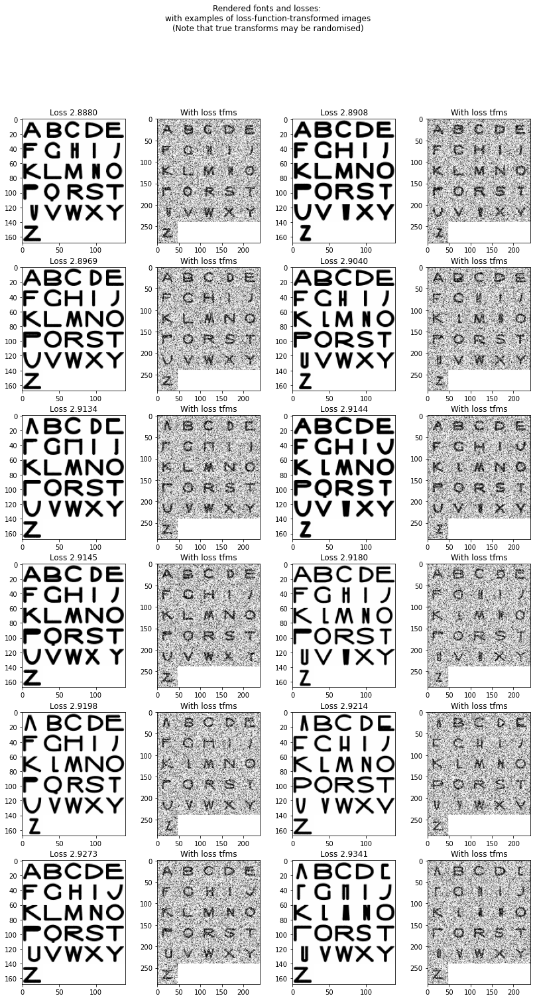

In [ ]:
_ = show_variation_renders(
    res, 
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(**learner_args), 
    )

### Step 1.1: Try to Combine Best Per-Letter Params From the Variations

If we have a look at the loss spreads per category, we can see that even the best variation (#0, below) has some suboptimal letters. Let's try to combine the best parameters from each category and see if we can just naïvely combine them.

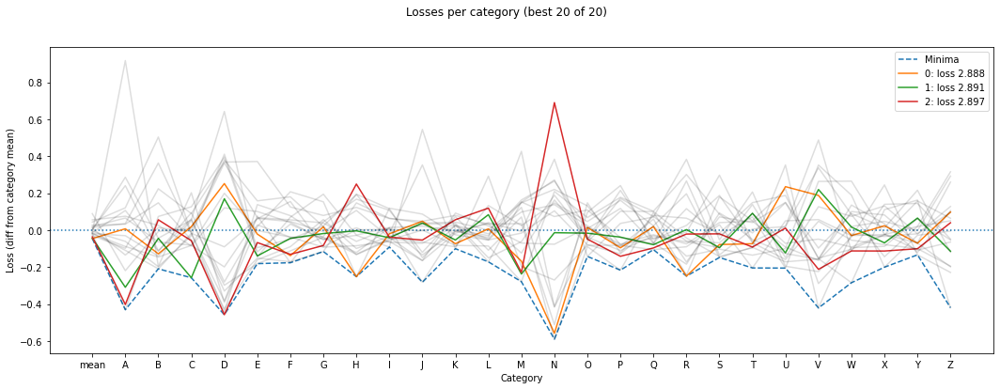

In [ ]:
plot_per_category_losses(res, plot_idx=range(3), plot_rest=True)

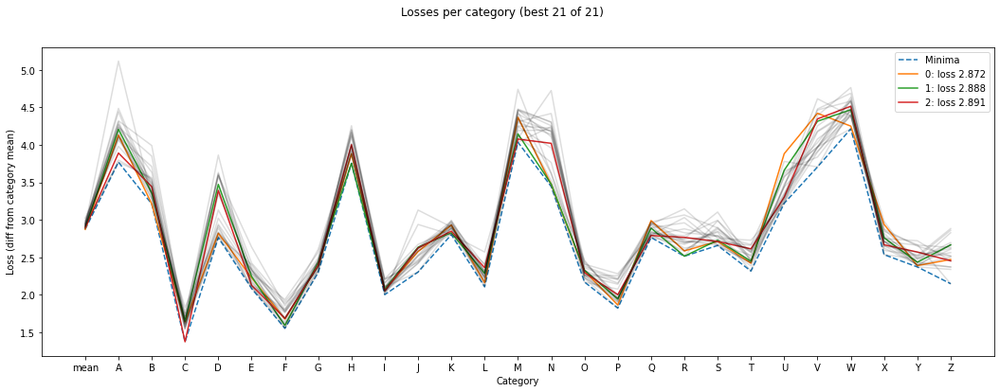

In [ ]:
plot_per_category_losses(res, plot_idx=range(3), plot_rest=True, deltas_from_mean=False)

#### Merge Parameters

In [ ]:
merged_params = merge_best_parameters(res, min_improvement=.1)
learn = None; gc.collect()
learn = get_learner(**learner_args)
learn.load_param_dict(merged_params)
l1 = res[0]["final_loss"]
l2 = learn.get_current_loss(10)
loss_d = l1 - l2
print(f"Loss improvement: {loss_d:.4} • {l1:.4} => {l2:.4}")


Change 'Width, AV' from 2.493 => 1.528
Change 'Width, D' from 2.009 => -0.4452
Change 'Width, CGOQ' from 0.6358 => 3.067
Change 'Width, J' from -0.6567 => 3.622
Change 'Width, L' from 2.336 => -2.129
Change 'Width, M' from 3.007 => 3.227
Change 'Width, TZ' from 1.506 => 0.601
Change 'Width, W' from 3.718 => 3.042
Change 'Width n difference from O, C' from -1.721 => 2.377
Change 'Width n difference from O, G' from 1.585 => -3.422
Change 'Offset x from symmetry, AXZ' from -1.384 => -0.5856
Change 'Crossbar y offset, A' from 1.944 => 0.09936
Change 'Crossbar y offset, G' from 2.733 => 0.3802
Change 'Crossbar y offset, P' from -3.846 => -3.562
Change 'Crossbar length, G' from -2.585 => -2.176
Change 'Bar stem height, G' from 3.33 => 3.346
Change 'Bowl aspect ratio, D' from -2.184 => -2.905
Change 'Bowl aspect ratio, J' from -3.761 => -2.358
Change 'Bowl aspect ratio, U' from -3.572 => -1.612
Change 'Bowl distortion, J' from 3.512 => 2.192
Change 'Upper width n difference, E' from 3.447 => 

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2801: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:680: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


Loss improvement: 0.0298 • 2.888 => 2.858


In [ ]:
best_params = learn.get_param_dict()

#### Finetune the Combined Model

Now that we just smashed all the params together, there probably is place for some further training of the model.

SuggestedLRs(valley=0.005248074419796467)

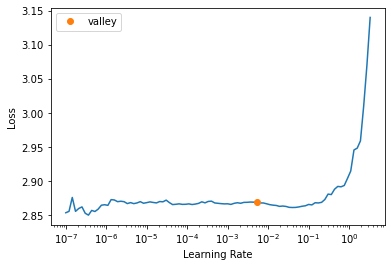

In [ ]:
learn.lr_find()

In [ ]:
learn.fit_one_cycle(100, .02)

epoch,train_loss,valid_loss,time
0,2.880221,2.806259,00:05
1,2.841393,2.865824,00:04
2,2.852427,2.876232,00:04
3,2.841981,2.824177,00:04
4,2.861947,2.940620,00:04
5,2.860300,2.827781,00:04
6,2.870824,2.854572,00:05
7,2.865551,2.872246,00:04
8,2.862833,2.911148,00:04
9,2.854771,2.882710,00:04


In [ ]:
l3 = learn.get_current_loss(10)
loss_d2 = l2 - l3
print(f"Loss improvement: {loss_d2:.4} • {l2:.4} => {l3:.4}")

Loss improvement: 0.0176 • 2.858 => 2.841


In [ ]:
best_res = dict(final_params = best_params)
recalculate_losses([best_res], incl_loss=True, iters=5, **learner_args)
res = [best_res] + res
dump(res, fp)

Recalculating loss for variation 1 of 1...inetuned_final.pth                                                            


/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2801: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:680: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2801: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:680: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


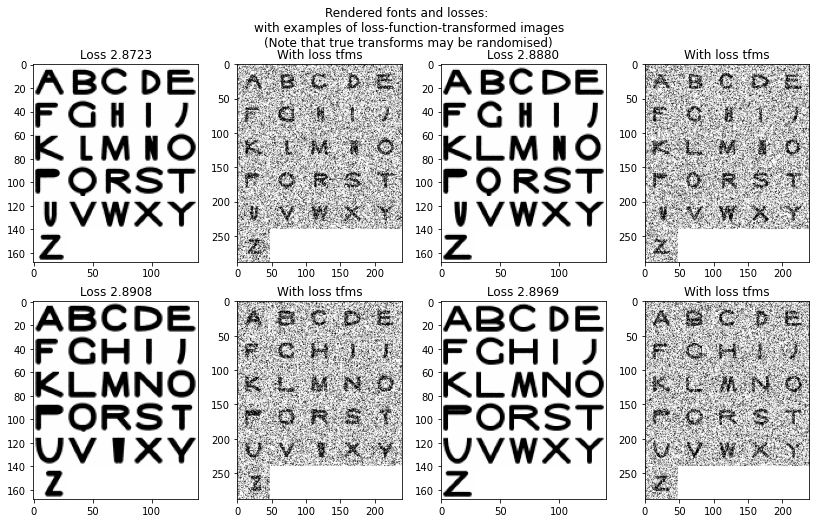

In [ ]:
_ = show_variation_renders(
    res, 
    n=4,
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(**learner_args), 
    )

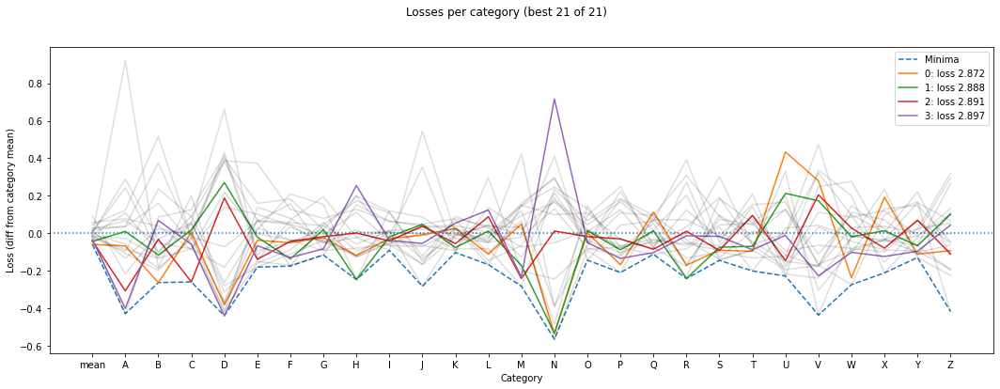

In [ ]:
plot_per_category_losses(res, plot_idx=range(4), plot_rest=True)

> We'll save the best parameters to `BEST_PARAMS_PATH`.

In [ ]:
dump(best_params, BEST_PARAMS_PATH)

#### Look at the Parameter Distribution

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2825: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")


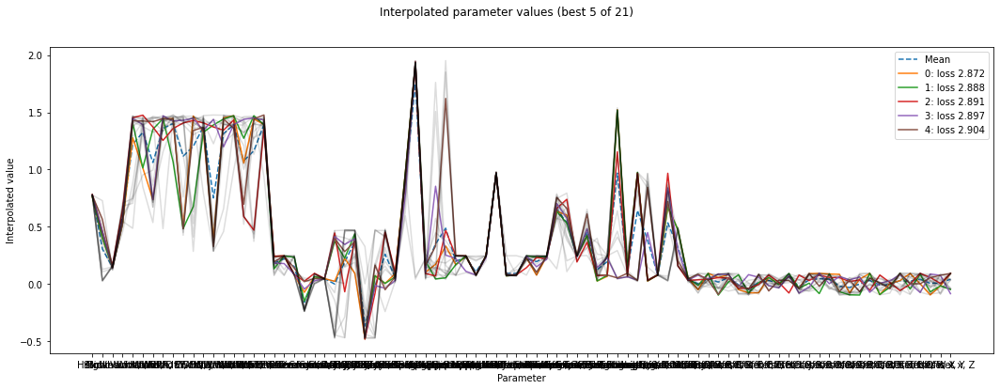

In [ ]:
fn_suffix = "v1"
fp = DUMP_FOLDER / f"{BASE_FN}_{fn_suffix}_all"
res = load(fp)
clear()
plot_parameter_values(res, plot_top_n=5, plot_rest=True)

#### Unsuccesful Trial: Try to Manually Edit Some Parameters

It seems like Q and J are suboptimal. Let's see if by manually altering their values we can get a better result.

In [ ]:
ocr_fn = FINETUNED_OCR_MODEL_FN
param_path = BEST_PARAMS_PATH
learner_args = dict(
    ocr_fn=ocr_fn,
)
learn = None; gc.collect()
learn = get_learner(**learner_args)
learn.load_param_dict(load(param_path))
loss = learn.get_current_loss(10)
clear()
loss

2.863490343093872

  52 Tail angle, Q                     3.44 ( 1.52)
  53 Tail length, Q                   -1.42 ( 0.14)
  54 Tail-bowl connection location, Q  3.55 ( 0.97)
  55 Tail inside fraction, Q          -3.59 ( 0.03)
  76 Offset x, Q                       0.93 ( 0.04)
  10 Width, J                          3.62 ( 1.47)
  34 Bowl aspect ratio, J             -2.36 ( 0.17)
  37 Bowl distortion, J                2.19 ( 0.24)
  47 Aperture, J                       0.33 ( 0.60)
  69 Offset x, J                       1.63 ( 0.07)


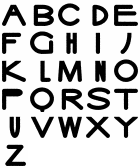

In [ ]:
learn.show_params("Q")
learn.show_params("J")
learn.render_letters()

Loss improvement: -0.000895786285400213


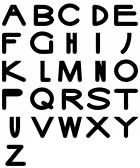

In [ ]:
learn.set_param("Tail angle, Q", -.75)
learn.set_param("Tail length, Q", 4.)
learn.set_param("Tail-bowl connection location, Q", -2.)
learn.set_param("Tail inside fraction, Q", .5)
loss2 = learn.get_current_loss(10)
print(f"Loss improvement: {loss - loss2}")
learn.render_letters()

> Curiously, the loss is actually greater with these changes.

## Step 2: Version 2 – Optimise Using Alt OCR Model (Version 1: V4–Decoder-Trained)

In [ ]:
res_2 = create_and_optimise_variations("v2", ocr_fn=FINETUNED_OCR_MODEL_ALT_FN, variations=5)

Merge loss improvement: 0.009031 • 2.612 => 2.603
Merge loss improvement after finetuning: 0.02343 • 2.603 => 2.58


NB. Below, the first version is the one merged from the 5 variations and finetuned thereafter.

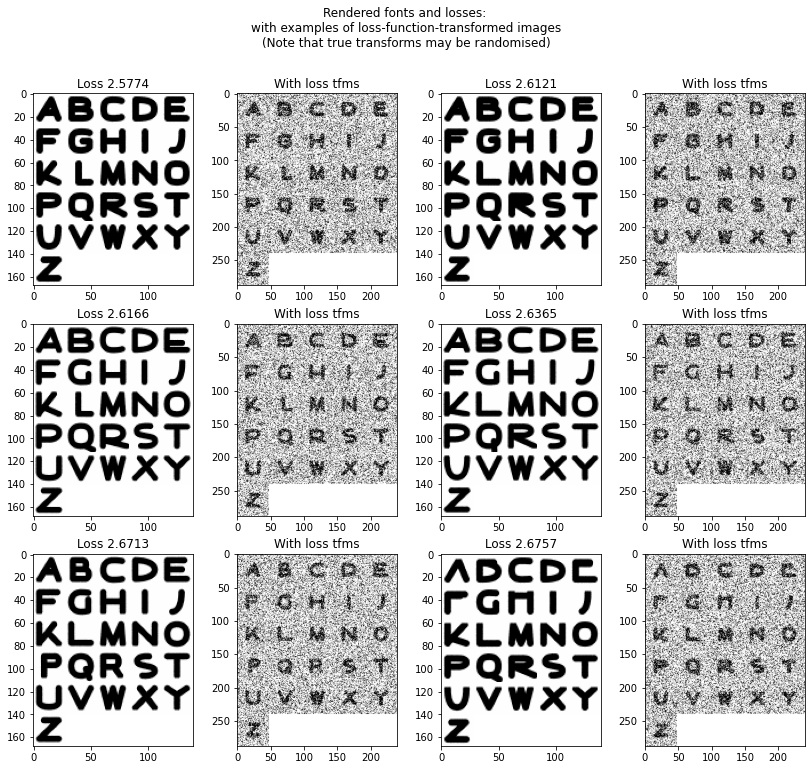

In [ ]:
_ = show_variation_renders(
    res_2, 
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(**learner_args), 
    )

> These variation look very different from Step 1, but they are very robust. Perhaps it was best to use a model with only V4 and decoder trained. Let's save the best parameters and jump to Step 9.2 to compare accuracies using this OCR model.

In [ ]:
dump(res_2[0]["final_params"], BEST_PARAMS_ALT_PATH)

## Step 3: Version 3 – Optimise Without Degradation

This is somewhat out of the experimental scope, but let's see what kind of font is produced if we do not degrade the renders.

Note that we will still use the finetuned OCR model.

> 2023-04-12: Let's redo v3 as v3a because it's previous results are curiously bad.

In [ ]:
# Previously v3, which had the worst peformance in all conditions in Step 6.3
res_5 = create_and_optimise_variations("v3a", ocr_fn=FINETUNED_OCR_MODEL_ALT_FN, variations=5, tfms=NO_TFMS)

Merge loss improvement: -0.0617 • 1.399 => 1.461
Merge loss improvement after finetuning: 0.1299 • 1.461 => 1.331


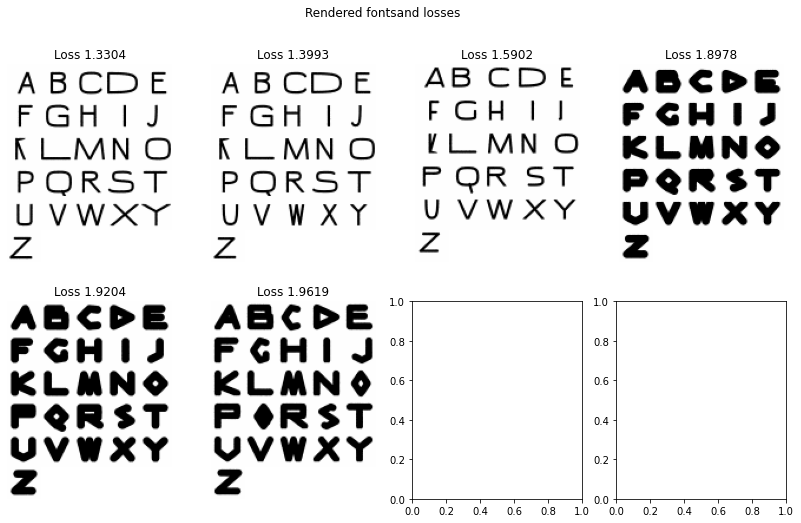

In [ ]:
_ = show_variation_renders(
    res_5, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(tfms=NO_TFMS), 
    )

With this setup there seems to be much more variation in the, uh, variations. Let's produce a few more.

In [ ]:
res_5b = create_and_optimise_variations("v3b", ocr_fn=FINETUNED_OCR_MODEL_ALT_FN, variations=5, tfms=NO_TFMS)

Merge loss improvement: -0.06597 • 1.397 => 1.463
Merge loss improvement after finetuning: 0.1253 • 1.463 => 1.337


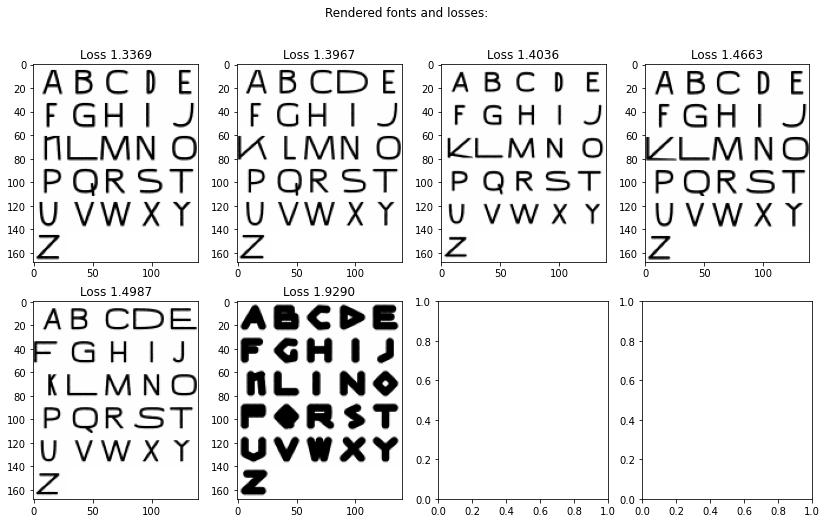

In [ ]:
_ = show_variation_renders(
    res_5b, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(tfms=NO_TFMS), 
    )

Let's combine the variations from all runs and save them in `v3`.

In [ ]:
res_3ab = load(get_variations_filepath("v3")) + load(get_variations_filepath("v3a"))
res_3ab.sort(key=lambda x: x["final_loss"])
len(res_3ab)
dump(res_3ab, get_variations_filepath("v3"))

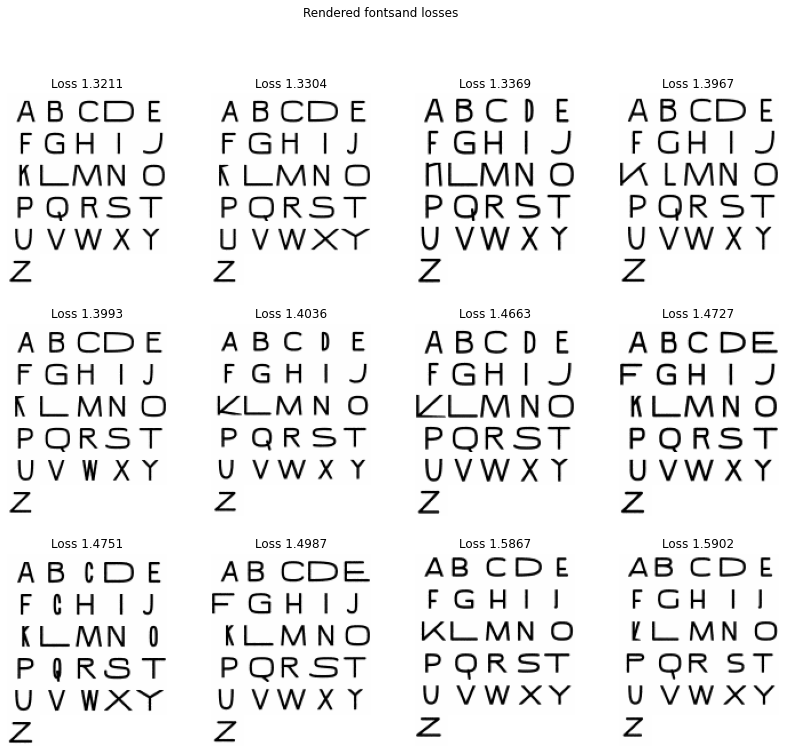

In [ ]:
_ = show_variation_renders(
    res_3ab, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(tfms=NO_TFMS),
    )

## Step 4: Version 4a & 4b – Optimise With a Non-Finetuned Model

Version 1 had the highest correlation before finetuning

    Pearson R v1 Degraded     0.7528166237050146
    p v1 Degraded             1.274530767277531e-60

### Step 4.1: With Degradations

In [ ]:
res_4a = create_and_optimise_variations("v4a", ocr_fn=NONFINETUNED_OCR_MODEL_FN, variations=5)

Merge loss improvement: -0.01135 • 1.537 => 1.549
Merge loss improvement after finetuning: 0.03287 • 1.549 => 1.516


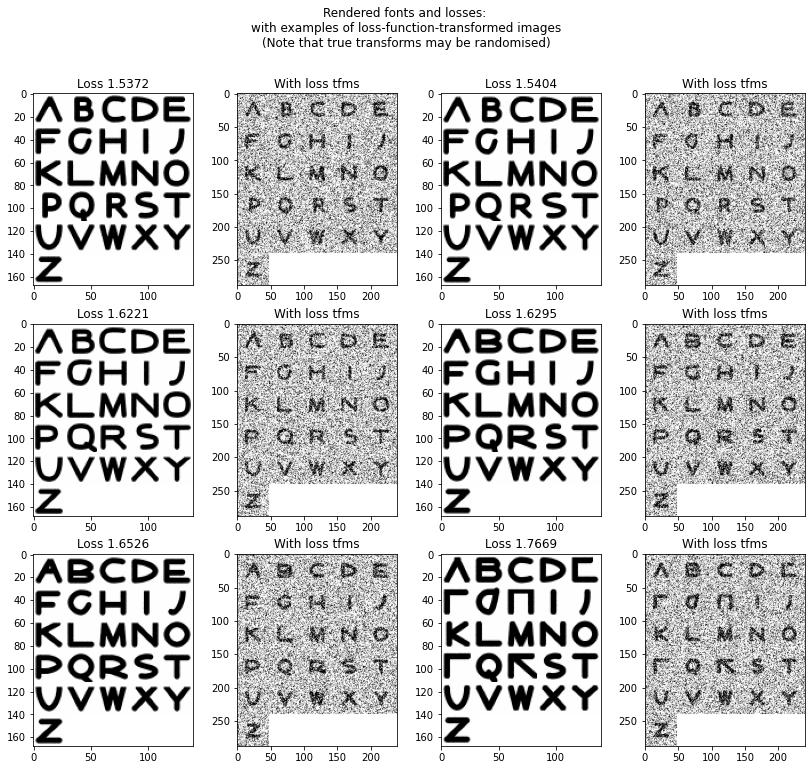

In [ ]:
_ = show_variation_renders(
    res_4a, 
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(), 
    )

### Step 4.2: Without Degradations

In [ ]:
res_4b = create_and_optimise_variations("v4b", ocr_fn=NONFINETUNED_OCR_MODEL_FN, variations=5, tfms=NO_TFMS)

Merge loss improvement: -9.055e-05 • 0.03478 => 0.03487
Merge loss improvement after finetuning: 0.002289 • 0.03487 => 0.03258


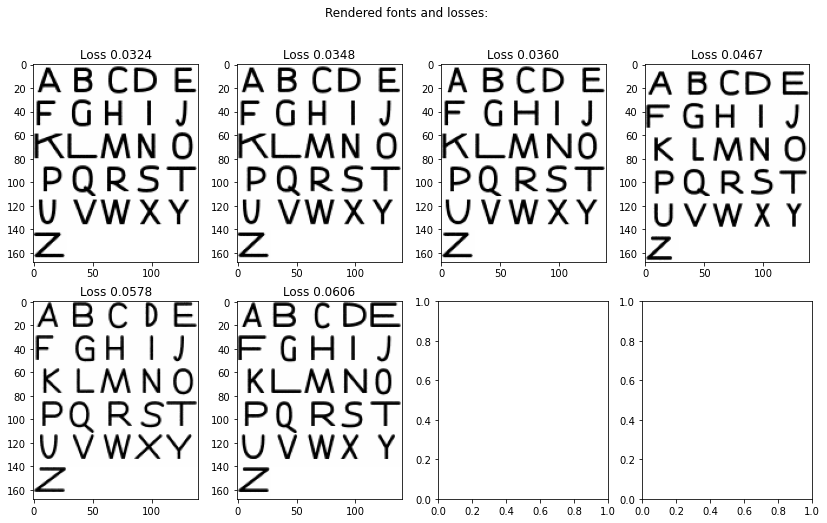

In [ ]:
_ = show_variation_renders(
    res_4b, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(tfms=NO_TFMS), 
    )

## Interlude 1: Optimise to Match Arial Bold

Preliminary results show that Arial Bold is actually the most readable font with the 50%-accuracy noise level.

Let's first set the parameters to that and then optimise it further and see where we land.

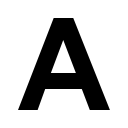

Loss: 0.36084359884262085


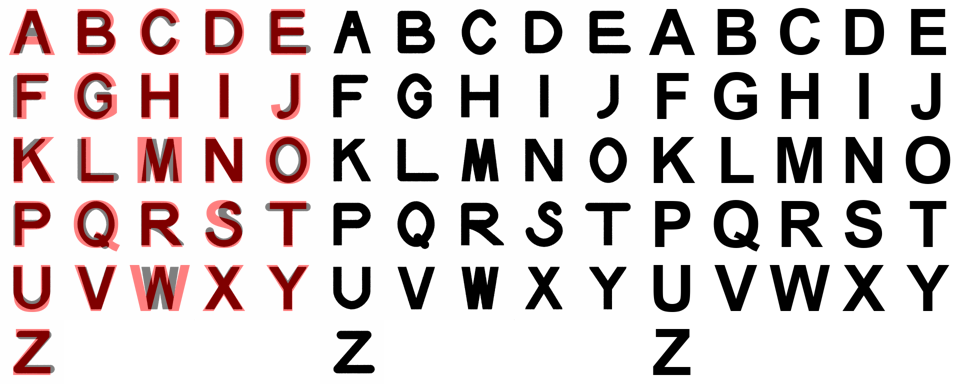

In [ ]:


learn = get_match_font_learner()
clear()
learn.set_param("Height", 1.5)
display(img_from_tensor(learn.loss_func.target_letters[0][0]))
learn.show_renders_and_target()
# image_grid([img_from_tensor(o[0]) for o in learn.loss_func.target_letters])

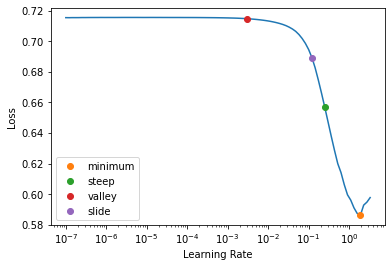

In [ ]:
lrs = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide), show_plot=True)

In [ ]:
lrs

SuggestedLRs(minimum=0.19054607152938843, steep=0.25118863582611084, valley=0.0030199517495930195, slide=0.12022644281387329)

In [ ]:
learn.fit_one_cycle(30, 1.)

epoch,train_loss,valid_loss,time
0,0.360969,0.329674,00:05
1,0.345203,0.278681,00:05
2,0.322487,0.216391,00:05
3,0.295144,0.197563,00:04
4,0.274874,0.188894,00:05
5,0.259798,0.220093,00:05
6,0.253717,0.201321,00:05
7,0.246678,0.208185,00:05
8,0.242016,0.208428,00:04
9,0.238320,0.188924,00:04


Loss: 0.10070830583572388


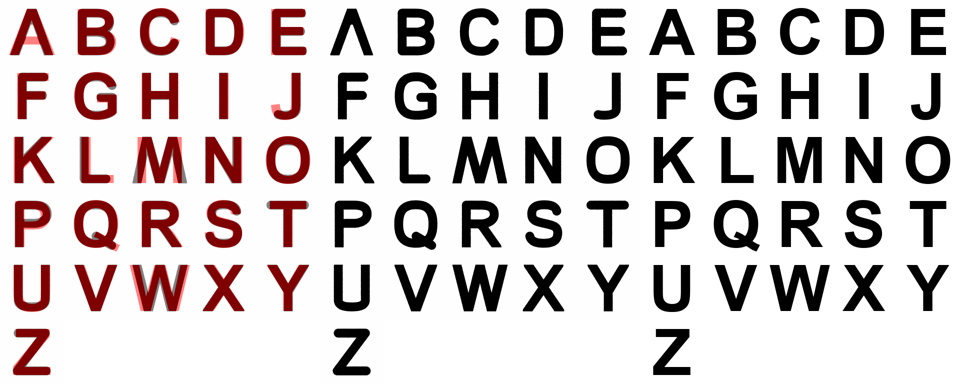

In [ ]:
learn.show_renders_and_target()

We need to manually release A crossbar from its collapsed state.

In [ ]:
learn.set_param("Crossbar y offset, A", 1.)
learn.fit_one_cycle(30, .25)

epoch,train_loss,valid_loss,time
0,0.100160,0.099432,00:05
1,0.099731,0.098255,00:05
2,0.099212,0.095551,00:05
3,0.098268,0.090588,00:05
4,0.096669,0.089379,00:05
5,0.095385,0.089810,00:05
6,0.094556,0.090414,00:05
7,0.094011,0.086887,00:04
8,0.093171,0.086687,00:05
9,0.092444,0.083610,00:05


Loss: 0.07745320349931717


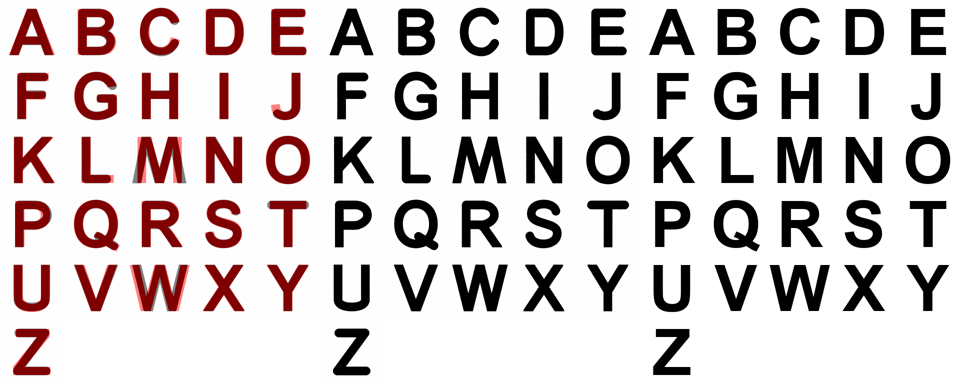

In [ ]:
learn.show_renders_and_target()

In [ ]:
learn.fit_one_cycle(50, .025)

epoch,train_loss,valid_loss,time
0,0.077533,0.077466,00:05
1,0.077462,0.077412,00:04
2,0.077408,0.077235,00:04
3,0.077319,0.076978,00:04
4,0.077253,0.076616,00:04
5,0.077136,0.076318,00:04
6,0.077023,0.075804,00:04
7,0.076865,0.075710,00:04
8,0.076726,0.075566,00:04
9,0.076585,0.075053,00:05


Loss: 0.07384516298770905


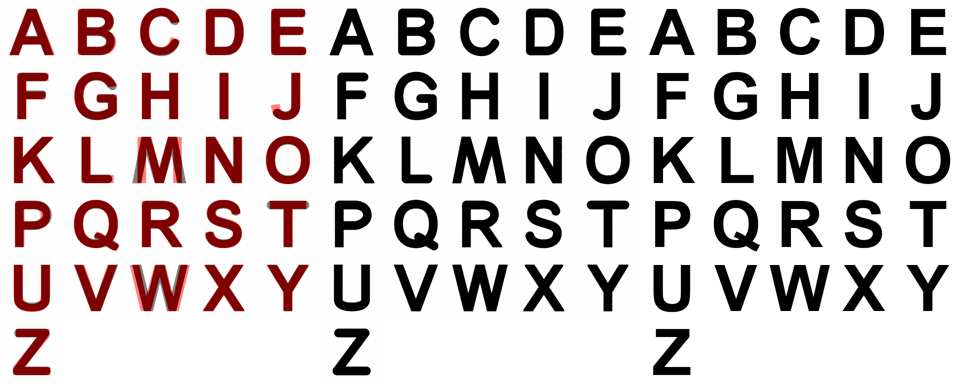

In [ ]:
learn.show_renders_and_target()

In [ ]:
learn.fit_one_cycle(50, .025)

epoch,train_loss,valid_loss,time
0,0.073767,0.073869,00:05
1,0.073845,0.073759,00:04
2,0.073763,0.073780,00:04
3,0.073772,0.073758,00:04
4,0.073797,0.073470,00:05
5,0.073776,0.073575,00:05
6,0.073751,0.073683,00:04
7,0.073723,0.073393,00:04
8,0.073704,0.073532,00:04
9,0.073661,0.073349,00:04


Loss: 0.0726335346698761


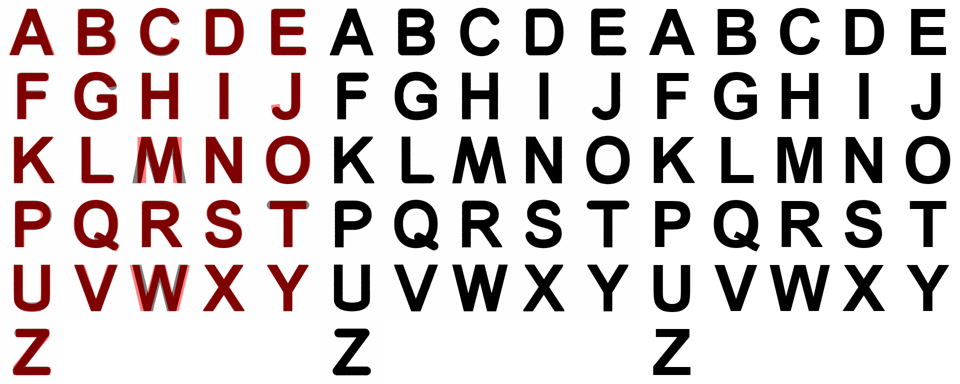

In [ ]:
learn.show_renders_and_target()

Save the parameters to a file.

In [ ]:
dump(learn.get_param_dict(), ARIAL_BOLD_PARAMS_PATH)

#### Addendum 2023-04-22: Correct Faulty 'M'

For some reason, M is stuck in a suboptimal form. Let's manually tweak it a bit.

In [ ]:
learn = get_match_font_learner()
learn.load_param_dict(load(ARIAL_BOLD_PARAMS_PATH))
learn.show_params("M")

/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2829: UserWarning: Using default input_shape: (128, 128)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2409: UserWarning: Model param specs have a max height of 0.800000011920929 but font_size to match is 1.0!
  warn(f"Model param specs have a max height of {ps['Height'].max.item()} but font_size to match is {font_size}!")


  13 Width, M                          2.37 ( 1.39)
  51 Stem xp offset from vertical, M   0.24 ( 0.21)
  72 Offset x, M                      -6.69 (-0.10)


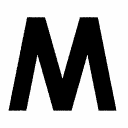

In [ ]:
learn.render_letter("M")

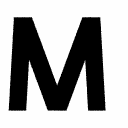

In [ ]:
learn.set_param("Stem xp offset from vertical, M", -4.)
learn.set_param("Width, M", 1.)
learn.render_letter("M")

> It seems there's a bug in `SansSerifFontR`, but let's not correct that lest all of the other experimental results become void.

## Interlude 2: How Many Iterations Are Needed to Denoise Accuracy Metrics?

We might want to do some iterative accuracy evaluation inside the optimisation loop, so let's quickly have a look at how many iterations of accuracy evaluation are needed to get a denoised average.

We'll calculate the metrics for 10 tries * 1000 iterations and plot the absolute difference to the full median of each iteration for each try.

In [23]:
initial_params = load(ARIAL_BOLD_PARAMS_PATH)
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
tfms = ACC_50_TFMS
learn = get_learner()
learn.load_param_dict(initial_params)
df = learn.render_letters_as_df()
ocr_model = load_ocr_model(file=ocr_fn, arch=cornet_for_ocr, n_out=26)
all_res = []
for i in range(9):
    print(f"Starting iteration {i+1}")
    res = get_model_accuracy_metrics(ocr_model, 
                                    iters=1000, 
                                    df=df, 
                                    show_batch=False, 
                                    splitter=cornet_splitter, 
                                    return_iters=True,
                                    **tfms)
    all_res.append(res)
    clear()
len(all_res)

10

For each try, plot the absolute difference between the try's full mean and the moving average at each iteration step.

In [52]:
fp = DUMP_FOLDER/"e3_acc_metrics_comparison_10x1000_iters.pkl"
all_diffs = []
all_preds = torch.concat([o[-2].unsqueeze(dim=0) for o in all_res], dim=0)
bs = len(df)
full_median = all_preds.median().item()
for preds in all_preds:
    medians = []
    for i in range(preds.shape[0] // bs):
        medians.append(preds[:(i+1)*bs].median())
    all_diffs.append(np.abs(np.array(medians) - full_median))
dump((all_diffs,all_preds), fp)

Plot just the mean and std of the moving differences (which are based on medians on the contrary).

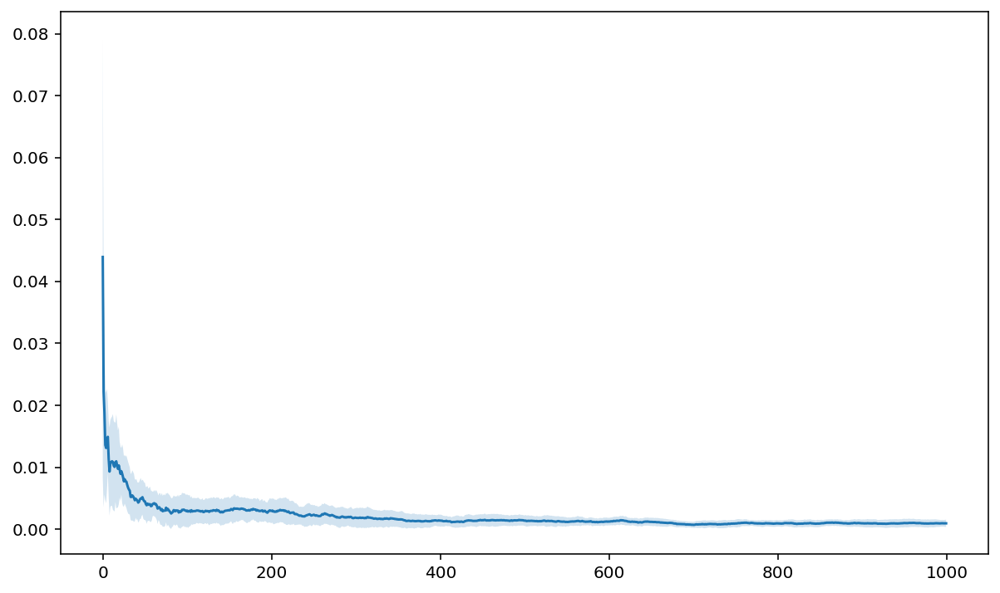

In [53]:
all_diffs,_ = load(fp)
all_diffs = np.stack(all_diffs, axis=0)
fig = plt.figure(figsize=(10,6), dpi=144)
plt.plot(all_diffs.mean(axis=0))
plt.fill_between(x=range(all_diffs.shape[1]),
                 y1=all_diffs.mean(axis=0)-all_diffs.std(axis=0),
                 y2=all_diffs.mean(axis=0)+all_diffs.std(axis=0),
                 alpha=0.2)

Hmmm, it looks like we need to go 100 iterations, which is value we've been using. Even with that the average error is ~.003

In [61]:
for i in range(20):
    it = i * 10
    print(f"{it:>4}: {all_diffs.mean(axis=0)[it]:0.3}")

   0: 0.044
  10: 0.0109
  20: 0.00963
  30: 0.00671
  40: 0.00479
  50: 0.00448
  60: 0.00413
  70: 0.00325
  80: 0.00275
  90: 0.0027
 100: 0.00301
 110: 0.00294
 120: 0.00278
 130: 0.00296
 140: 0.00273
 150: 0.00305
 160: 0.0033
 170: 0.00302
 180: 0.00318
 190: 0.00285


Let's also quickly look at the noise of recognition accuracy in a noiseless condition.

In [28]:
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
tfms = NO_TFMS
learn = get_learner()
learn.load_param_dict(load(ARIAL_BOLD_PARAMS_PATH))
res = []
for i in range(10):
    df = learn.render_letters_as_df()
    ocr_model = load_ocr_model(file=ocr_fn, arch=cornet_for_ocr, n_out=26)
    r = get_model_accuracy_metrics(ocr_model, 
                                    iters=1, 
                                    df=df, 
                                    show_batch=False, 
                                    splitter=cornet_splitter, 
                                    return_iters=True,
                                    **tfms)
    res.append(r)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2833: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")


In [29]:
means = np.array([o[1] for o in res])
means.mean(), means.std()

(0.6325271308422089, 0.0016249033535121764)

## Step 5: Initialise From Arial Bold Params

> A smaller `lr` seems to work better with non-random initalisations. We'll first look for a nice regime.

### Preparation: Analyse the Loss and Accuracy Trajectory

Let's see how the accuracy evolves during training.

Fancy fit: [
    [400, 1.],
    [150, .5],
    [150, .2]
]

Merge : 100, .02

In [9]:
initial_params = load(ARIAL_BOLD_PARAMS_PATH)
arial_bold_res = [dict(initial_params=initial_params)]
arial_n_vars = 3

In [107]:
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
learn = get_learner(ocr_fn=ocr_fn)
learn.load_param_dict(initial_params)
# display(learn.render_letters(apply_tfms=True))
params_cb = SaveParamsCB()
learn.add_cb(params_cb)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2831: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 2.4382


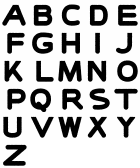

Epoch: 19, Last loss: 2.5231


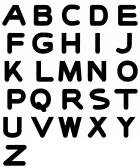

Epoch: 29, Last loss: 2.4806


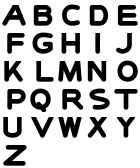

Epoch: 39, Last loss: 2.5604


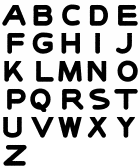

Epoch: 49, Last loss: 2.4637


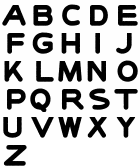

Epoch: 59, Last loss: 2.4927


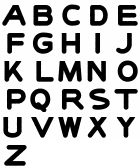

Epoch: 69, Last loss: 2.5269


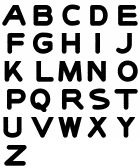

Epoch: 79, Last loss: 2.5409


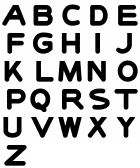

Epoch: 89, Last loss: 2.5068


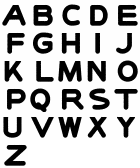

Epoch: 99, Last loss: 2.4759


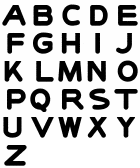

In [83]:
learn.fit_one_cycle(100, .2)
learn.fit_one_cycle(100, .02)

In [87]:
probs = []
for p in params_cb.params:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs_df = DataFrame(probs)
clear()
probs_df

,target_prob,loss,epoch
0,0.419716,17.271919,9
1,0.445775,11.158087,19
2,0.422075,5.447533,29
3,0.419471,3.503986,39
4,0.444334,2.513874,49
5,0.441689,2.536400,59
6,0.436012,2.519299,69
7,0.439116,2.607599,79
8,0.451904,2.535789,89
9,0.448601,2.523085,99


In [ ]:
fp2 = DUMP_FOLDER/"e3_lr_tests_1.pkl"
dump(dict(params=params_cb.params, probs2_df=probs2_df), fp2)

Let's try with a higher lr.

Epoch: 9, Last loss: 12.1598


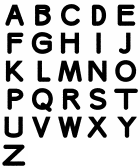

Epoch: 19, Last loss: 2.9473


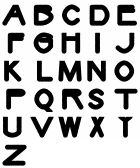

Epoch: 29, Last loss: 2.8127


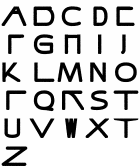

Epoch: 39, Last loss: 2.8569


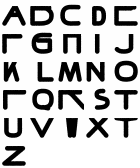

Epoch: 49, Last loss: 2.8333


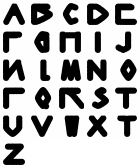

Epoch: 59, Last loss: 2.6274


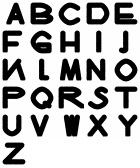

Epoch: 69, Last loss: 2.5975


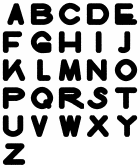

Epoch: 79, Last loss: 2.6442


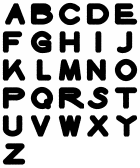

Epoch: 89, Last loss: 2.6104


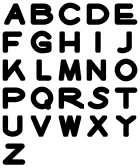

Epoch: 99, Last loss: 2.5771


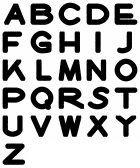

In [96]:
learn2 = get_learner(ocr_fn=ocr_fn)
learn2.load_param_dict(initial_params)
# display(learn.render_letters(apply_tfms=True))
params2_cb = SaveParamsCB()
learn2.add_cb(params2_cb)
learn2.fit_one_cycle(100, 1.)

Epoch: 9, Last loss: 2.5279


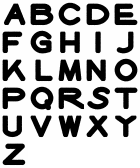

Epoch: 19, Last loss: 2.6143


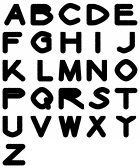

Epoch: 29, Last loss: 2.6902


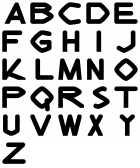

Epoch: 39, Last loss: 2.6821


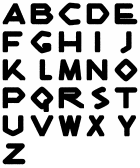

Epoch: 49, Last loss: 2.5923


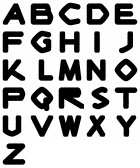

Epoch: 59, Last loss: 2.7083


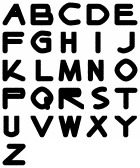

Epoch: 69, Last loss: 2.5456


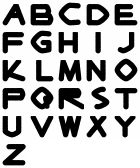

Epoch: 79, Last loss: 2.5446


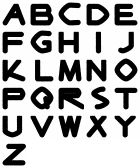

Epoch: 89, Last loss: 2.5689


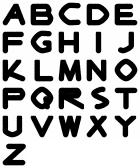

Epoch: 99, Last loss: 2.6076


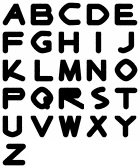

In [97]:
learn2.fit_one_cycle(100, .5)

In [99]:
probs = []
for p in params2_cb.params:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs3_df = DataFrame(probs)
clear()
probs3_df

,target_prob,loss,epoch
0,0.426738,12.159847,9
1,0.350845,2.947307,19
2,0.300531,2.812726,29
3,0.307375,2.856890,39
4,0.270278,2.833321,49
5,0.340522,2.627357,59
6,0.349543,2.597507,69
7,0.361307,2.644166,79
8,0.401577,2.610424,89
9,0.398743,2.577060,99


In [ ]:
fp3 = DUMP_FOLDER/"e3_lr_tests_2.pkl"
dump(dict(params2=params2_cb.params, probs3_df=probs3_df), fp3)

> Interestingly, it the higher learning rates lead to suboptimal results. In a sense, this is to be expected, because the initialisation is at a quite optimal level.

Let's try to decrease the `lr` even further.

In [108]:
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
learn = get_learner(ocr_fn=ocr_fn)
learn.load_param_dict(initial_params)
# display(learn.render_letters(apply_tfms=True))
params_cb = SaveParamsCB()
learn.add_cb(params_cb)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 18.7792


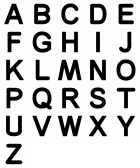

Epoch: 19, Last loss: 18.4796


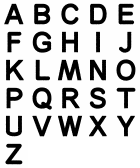

Epoch: 29, Last loss: 17.7636


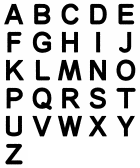

Epoch: 39, Last loss: 16.7191


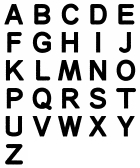

Epoch: 49, Last loss: 15.4356


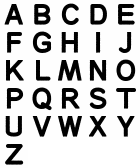

Epoch: 59, Last loss: 14.0427


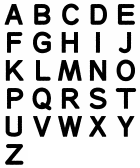

Epoch: 69, Last loss: 12.8766


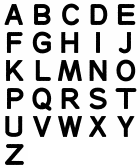

Epoch: 79, Last loss: 11.6885


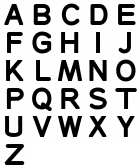

Epoch: 89, Last loss: 10.7892


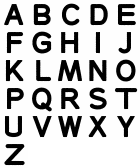

Epoch: 99, Last loss: 9.9796


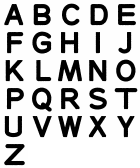

Epoch: 109, Last loss: 9.2336


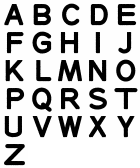

Epoch: 119, Last loss: 8.6314


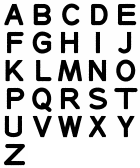

Epoch: 129, Last loss: 8.2416


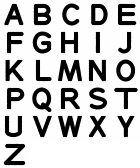

Epoch: 139, Last loss: 7.8519


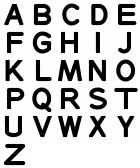

Epoch: 149, Last loss: 7.6442


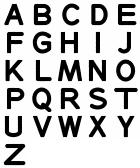

Epoch: 159, Last loss: 7.4771


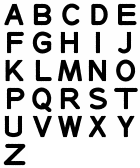

Epoch: 169, Last loss: 7.3996


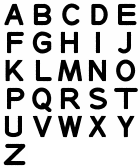

Epoch: 179, Last loss: 7.3947


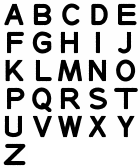

Epoch: 189, Last loss: 7.3539


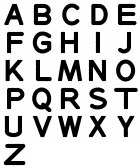

Epoch: 199, Last loss: 7.3678


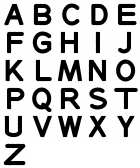

In [109]:
learn.fit_one_cycle(200, .02)

In [110]:
probs = []
for p in params_cb.params:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs_df = DataFrame(probs)
clear()
probs_df

,target_prob,loss,epoch
0,0.408138,18.779190,9
1,0.405132,18.479620,19
2,0.417203,17.763630,29
3,0.422887,16.719118,39
4,0.427482,15.435587,49
5,0.437325,14.042650,59
6,0.437020,12.876604,69
7,0.451425,11.688498,79
8,0.446278,10.789234,89
9,0.446377,9.979569,99


The results are even better. However, we're getting very high losses, which are due to `ParamLoss` (note that font matching did not make use of that).

In [112]:
{k:v for k,v in initial_params.items() if abs(v) >= 4.}

{'Width, W': 5.642993927001953,
 'Width n difference from O, C': 5.896511077880859,
 'Bowl distortion, J': 4.05398416519165,
 'Upper bowl xn offset, B': -4.124007225036621,
 'Upper width n difference, E': -6.347779273986816,
 'Upper bowl xp offset, S': -9.785286903381348,
 'Arm xn offset, K': -5.077688694000244,
 'Leg-bowl connection location, R': 4.617262840270996,
 'Offset x, M': -6.6853766441345215}

Let's redo the training with these clipped.

In [11]:
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
learn = get_learner(ocr_fn=ocr_fn)
learn.load_param_dict(initial_params, clip=4.)
# display(learn.render_letters(apply_tfms=True))
params_cb = SaveParamsCB()
learn.add_cb(params_cb)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 2.6189


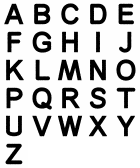

Epoch: 19, Last loss: 2.5684


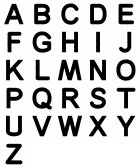

Epoch: 29, Last loss: 2.6167


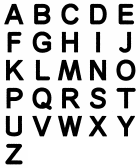

Epoch: 39, Last loss: 2.6513


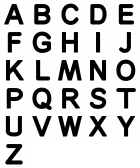

Epoch: 49, Last loss: 2.6181


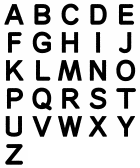

Epoch: 59, Last loss: 2.6121


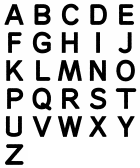

Epoch: 69, Last loss: 2.4965


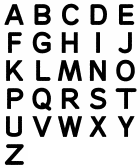

Epoch: 79, Last loss: 2.5058


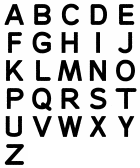

Epoch: 89, Last loss: 2.6208


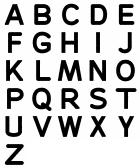

Epoch: 99, Last loss: 2.5928


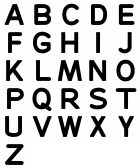

Epoch: 109, Last loss: 2.5707


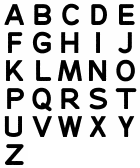

Epoch: 119, Last loss: 2.5306


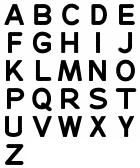

Epoch: 129, Last loss: 2.6146


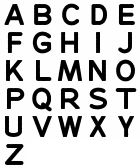

Epoch: 139, Last loss: 2.5627


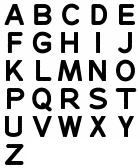

Epoch: 149, Last loss: 2.5029


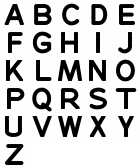

Epoch: 159, Last loss: 2.5380


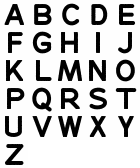

Epoch: 169, Last loss: 2.5095


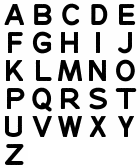

Epoch: 179, Last loss: 2.5842


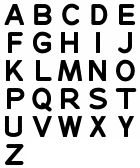

Epoch: 189, Last loss: 2.5713


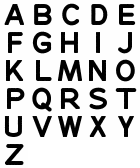

Epoch: 199, Last loss: 2.4823


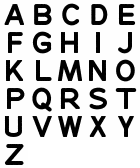

In [12]:
learn.fit_one_cycle(200, .02)

In [13]:
probs = []
for p in params_cb.params:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs_df = DataFrame(probs)
clear()
probs_df

,target_prob,loss,epoch
0,0.403586,2.618947,9
1,0.412380,2.568386,19
2,0.420700,2.616684,29
3,0.419733,2.651273,39
4,0.435457,2.618052,49
5,0.444760,2.612115,59
6,0.445047,2.496537,69
7,0.444507,2.505832,79
8,0.449217,2.620750,89
9,0.448503,2.592759,99


The loss trajectory is much less steep, as expected, but maybe the `lr` is now too low, as the losses themselves are 3–7 times lower.

In [14]:
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
learn = get_learner(ocr_fn=ocr_fn)
learn.load_param_dict(initial_params, clip=4.)
# display(learn.render_letters(apply_tfms=True))
params_cb = SaveParamsCB()
learn.add_cb(params_cb)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2833: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 2.6647


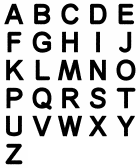

Epoch: 19, Last loss: 2.6214


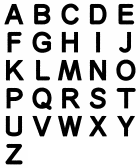

Epoch: 29, Last loss: 2.6667


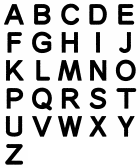

Epoch: 39, Last loss: 2.5385


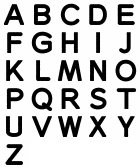

Epoch: 49, Last loss: 2.5446


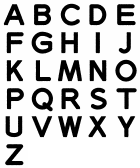

Epoch: 59, Last loss: 2.5344


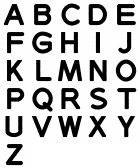

Epoch: 69, Last loss: 2.5153


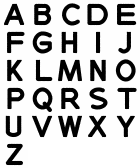

Epoch: 79, Last loss: 2.5115


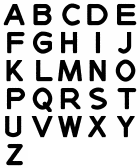

Epoch: 89, Last loss: 2.5119


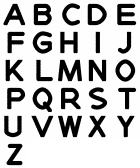

Epoch: 99, Last loss: 2.4778


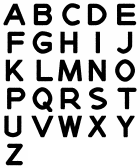

Epoch: 109, Last loss: 2.4704


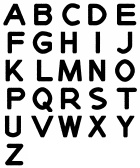

Epoch: 119, Last loss: 2.4623


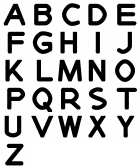

Epoch: 129, Last loss: 2.4689


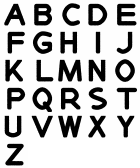

Epoch: 139, Last loss: 2.4985


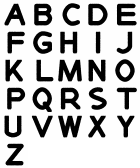

Epoch: 149, Last loss: 2.5345


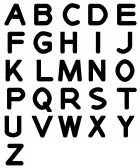

Epoch: 159, Last loss: 2.5217


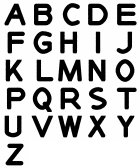

Epoch: 169, Last loss: 2.5063


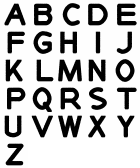

Epoch: 179, Last loss: 2.4396


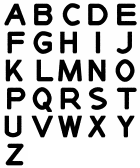

Epoch: 189, Last loss: 2.4397


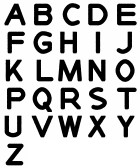

Epoch: 199, Last loss: 2.4676


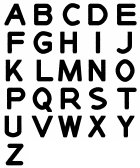

In [15]:
learn.fit_one_cycle(200, .02 * 3)

In [16]:
probs = []
for p in params_cb.params:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs_df = DataFrame(probs)
clear()
probs_df

,target_prob,loss,epoch
0,0.407167,2.664701,9
1,0.414934,2.621411,19
2,0.431095,2.666664,29
3,0.444233,2.538491,39
4,0.450331,2.544590,49
5,0.458133,2.534405,59
6,0.455115,2.515263,69
7,0.462779,2.511538,79
8,0.466370,2.511911,89
9,0.477315,2.477825,99


Let's try to train it a bit further.

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 2.4890


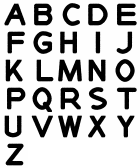

Epoch: 19, Last loss: 2.4585


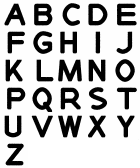

Epoch: 29, Last loss: 2.4131


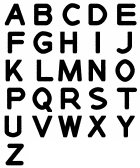

Epoch: 39, Last loss: 2.4588


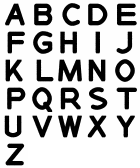

Epoch: 49, Last loss: 2.4713


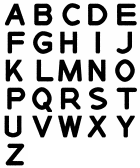

Epoch: 59, Last loss: 2.4829


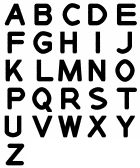

Epoch: 69, Last loss: 2.4541


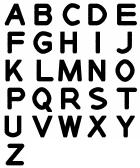

Epoch: 79, Last loss: 2.4876


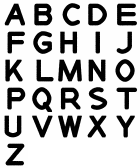

Epoch: 89, Last loss: 2.4841


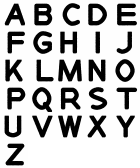

Epoch: 99, Last loss: 2.4985


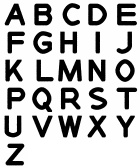

In [17]:
learn.fit_one_cycle(100, .02)

In [18]:
probs = []
for p in params_cb.params:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs_df = DataFrame(probs)
clear()
probs_df

,target_prob,loss,epoch
0,0.406962,2.664701,9
1,0.417187,2.621411,19
2,0.431005,2.666664,29
3,0.438869,2.538491,39
4,0.447969,2.544590,49
5,0.461584,2.534405,59
6,0.457316,2.515263,69
7,0.464639,2.511538,79
8,0.462876,2.511911,89
9,0.474448,2.477825,99


Let's do 100 epochs more.

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 2.4790


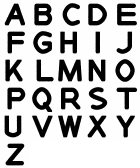

Epoch: 19, Last loss: 2.4702


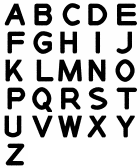

Epoch: 29, Last loss: 2.4716


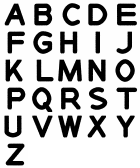

Epoch: 39, Last loss: 2.4431


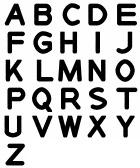

Epoch: 49, Last loss: 2.4408


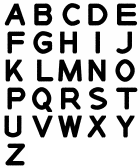

Epoch: 59, Last loss: 2.4862


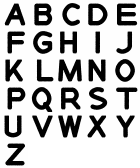

Epoch: 69, Last loss: 2.4326


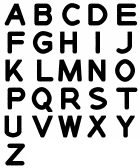

Epoch: 79, Last loss: 2.4484


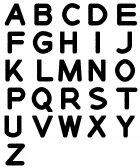

Epoch: 89, Last loss: 2.5037


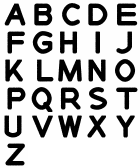

Epoch: 99, Last loss: 2.4991


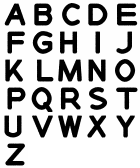

In [19]:
learn.fit_one_cycle(100, .02)

In [20]:
probs = []
for p in params_cb.params[-10:]:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs2_df = DataFrame(probs)
clear()
probs2_df

,target_prob,loss,epoch
0,0.477406,2.478977,9
1,0.478074,2.470161,19
2,0.473170,2.471637,29
3,0.478510,2.443061,39
4,0.480165,2.440777,49
5,0.475719,2.486237,59
6,0.478550,2.432648,69
7,0.475229,2.448379,79
8,0.476392,2.503731,89
9,0.471678,2.499111,99


The probabilities seem to converge to within the +/- .003 range of 100-iteration measurements. Let's just check if an even lower lr would yield something.

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 2.5431


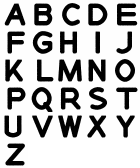

Epoch: 19, Last loss: 2.4360


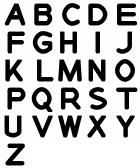

Epoch: 29, Last loss: 2.4970


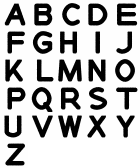

Epoch: 39, Last loss: 2.4893


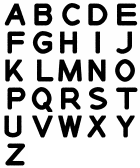

Epoch: 49, Last loss: 2.5116


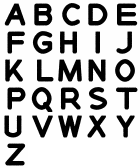

Epoch: 59, Last loss: 2.4127


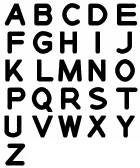

Epoch: 69, Last loss: 2.4987


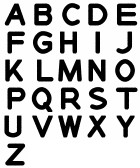

Epoch: 79, Last loss: 2.4420


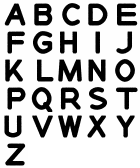

Epoch: 89, Last loss: 2.4386


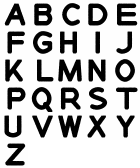

Epoch: 99, Last loss: 2.4419


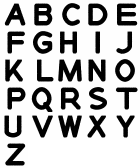

In [21]:
learn.fit_one_cycle(100, .02 / 5)

In [22]:
probs = []
for p in params_cb.params[-10:]:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs3_df = DataFrame(probs)
clear()
probs3_df

,target_prob,loss,epoch
0,0.480130,2.543114,9
1,0.479001,2.435950,19
2,0.477003,2.496997,29
3,0.478757,2.489344,39
4,0.472259,2.511565,49
5,0.479224,2.412665,59
6,0.481769,2.498735,69
7,0.475033,2.442010,79
8,0.471991,2.438554,89
9,0.472881,2.441860,99


No marked improvement. Thus:

> Let's use a training schedule of [(200, .06), (100, .02)] for training with Arial-Bold-initialisation.

### Loss and Accuracy Trajectory for Random Inits

Let's quickly check, how this pans out with random inits.

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2831: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


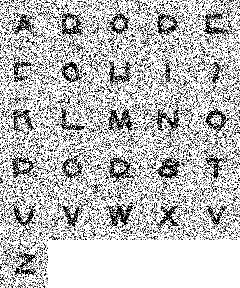

In [103]:
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
min_width,min_height = .5,.5
learn = get_learner(ocr_fn=ocr_fn); gc.collect()
if min_width is not None:
    for p in learn.param_names:
        if p.startswith("Width") and learn.get_param(p) < min_width: learn.set_param(p, min_width)
if min_height is not None:
    if learn.get_param("Height") < min_height: learn.set_param("Height", min_height)
display(learn.render_letters(apply_tfms=True))
params_cb = SaveParamsCB()
learn.add_cb(params_cb)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


Epoch: 9, Last loss: 2.6801


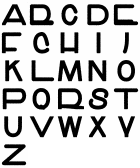

Epoch: 19, Last loss: 2.7724


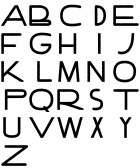

Epoch: 29, Last loss: 2.7879


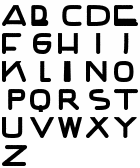

Epoch: 39, Last loss: 2.7473


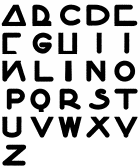

Epoch: 49, Last loss: 3.0773


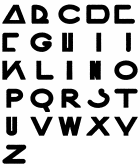

Epoch: 59, Last loss: 2.9052


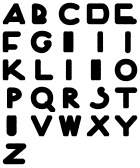

Epoch: 69, Last loss: 2.7262


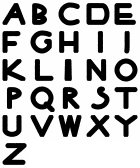

Epoch: 79, Last loss: 2.6921


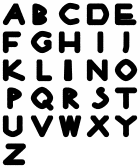

Epoch: 89, Last loss: 2.6113


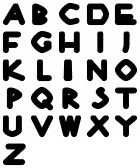

Epoch: 99, Last loss: 2.7034


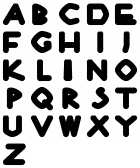

Epoch: 9, Last loss: 2.6940


Epoch: 19, Last loss: 2.7057


Epoch: 29, Last loss: 2.6434


Epoch: 39, Last loss: 2.7099


Epoch: 49, Last loss: 2.6770


Epoch: 59, Last loss: 2.6713


Epoch: 69, Last loss: 2.6453


Epoch: 79, Last loss: 2.6695


Epoch: 89, Last loss: 2.6870


Epoch: 99, Last loss: 2.5899


Epoch: 9, Last loss: 2.7006


Epoch: 19, Last loss: 2.6337


Epoch: 29, Last loss: 2.5711


Epoch: 39, Last loss: 2.5918


Epoch: 49, Last loss: 2.6377


Epoch: 59, Last loss: 2.5265


Epoch: 69, Last loss: 2.5440


Epoch: 79, Last loss: 2.5865


Epoch: 89, Last loss: 2.5550


Epoch: 99, Last loss: 2.5460


In [104]:
learn.fit_one_cycle(100, 1.)
learn.fit_one_cycle(100, .5)
learn.fit_one_cycle(100, .2)

In [105]:
probs = []
for p in params_cb.params:
    acc = get_accuracy(p["params"])
    probs.append(dict(target_prob=acc, loss=p["loss"], epoch=p["epoch"]))
probs_df = DataFrame(probs)
clear()
probs_df

,target_prob,loss,epoch
0,0.319976,2.680147,9
1,0.335918,2.772388,19
2,0.326285,2.787947,29
3,0.308397,2.747274,39
4,0.255075,3.077312,49
5,0.286060,2.905239,59
6,0.361676,2.726176,69
7,0.337816,2.692127,79
8,0.333576,2.611337,89
9,0.337169,2.703417,99


> The training regime seems to suit random initialisations better.

### Do the Actual Optimisations

* v5a2: v1_final • Degraded • Arial Bold
* v5b2: v1_final • Not degraded • Arial Bold
* v5c2: v1_finetuned • Degraded • Arial Bold
* v5d2: v1_finetuned • Not degraded • Arial Bold
* v5e2: v4_finetuned • Degraded • Arial Bold

In [9]:
initial_params = load(ARIAL_BOLD_PARAMS_PATH)
# Clamp within -4.,4.
for k,v in initial_params.items():
    if abs(v) > 4.: initial_params[k] = 4. if v > 0. else -4.
arial_bold_res = [dict(initial_params=initial_params)]
arial_n_vars = 3
runs = [(200, .06), (100, .02)]

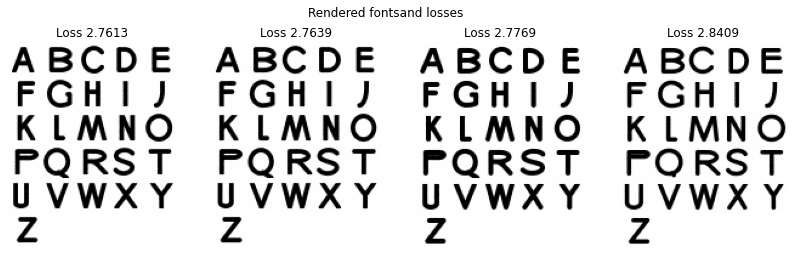

In [10]:
permutations = dict(
    v5a2=dict(ocr_fn=NONFINETUNED_OCR_MODEL_FN),
    v5b2=dict(ocr_fn=NONFINETUNED_OCR_MODEL_FN, tfms=NO_TFMS),
    v5c2=dict(ocr_fn=FINETUNED_OCR_MODEL_ALT_FN),
    v5d2=dict(ocr_fn=FINETUNED_OCR_MODEL_ALT_FN, tfms=NO_TFMS),
    v5e2=dict(ocr_fn=FINETUNED_OCR_MODEL_FN),
)
results = {}
for v,kwargs in permutations.items():
    results[v] = create_and_optimise_variations(v, init_res=arial_bold_res, variations=arial_n_vars, 
                                                max_init_loss=None, runs=runs, **kwargs)
    clear()

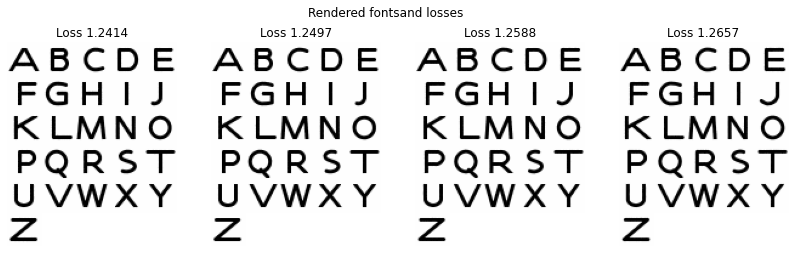

In [11]:
learner=get_learner(tfms=NO_TFMS)
_ = show_variation_renders(results["v5a2"], incl_tfms=False, rerender=True, learner=learner)

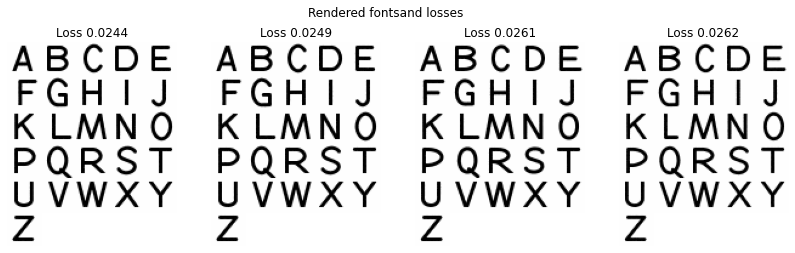

In [12]:
_ = show_variation_renders(results["v5b2"], incl_tfms=False, rerender=True, learner=learner)

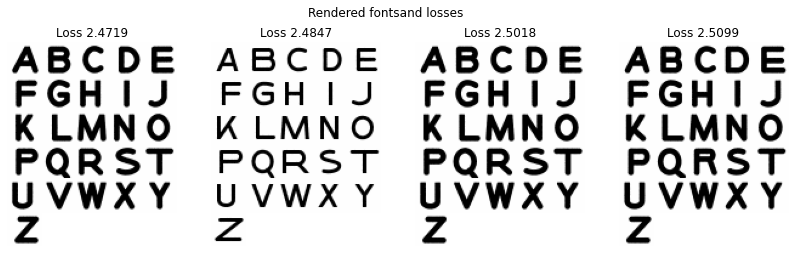

In [13]:
_ = show_variation_renders(results["v5c2"], incl_tfms=False, rerender=True, learner=learner)

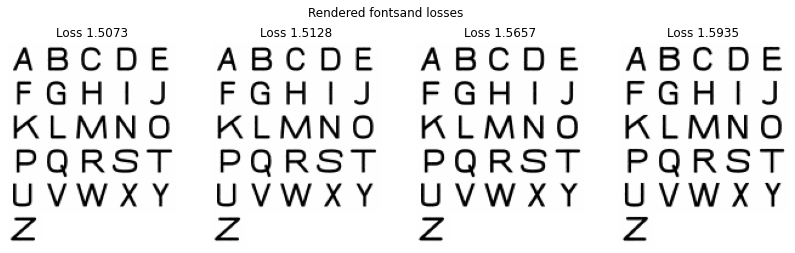

In [14]:
_ = show_variation_renders(results["v5d2"], incl_tfms=False, rerender=True, learner=learner)

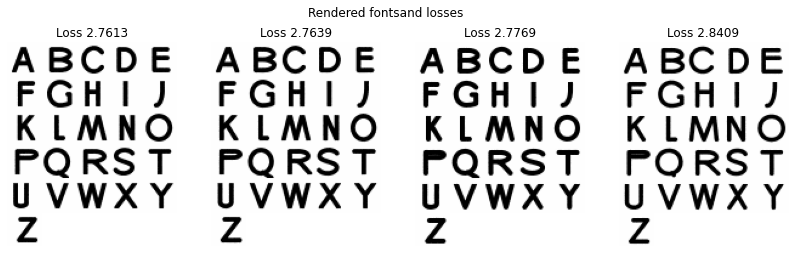

In [15]:
_ = show_variation_renders(results["v5e2"], incl_tfms=False, rerender=True, learner=learner)

Let's quickly check if we can use the loss to select the best variant, i.e., if it is line with accuracy.

In [24]:
res = results["v5c2"]
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
for r in res: r["probability_200"] = get_accuracy(r["final_params"], ocr_fn=ocr_fn, iters=200)
clear()
for r in sorted(res, key=lambda x: x["final_loss"]): 
    print(f"{r['final_loss']:0.4f} {r['probability']:0.4f} {r['probability_200']:0.4f}")

2.4719 0.4663 0.4601
2.4847 0.4689 0.4703
2.5018 0.4720 0.4711
2.5099 0.4621 0.4636


> The values are not completely in line, probably because only taking the prob of the correct output masks the differences in the rest of the probability distribution, which in turn has an effect on the loss. In retrospect, perhaps loss would've been a better candidate for measurement. However, if the output prob is the one we're looking for, we'll reorder the results by that below.

## Step 5.1: Let's Add an Unchanged Arial Bold AI Font for Comparison

We just need to convert it to a results format.

In [9]:
fp = get_variations_filepath("v5base")
params = load(ARIAL_BOLD_PARAMS_PATH)
ocr_fn = FINETUNED_OCR_MODEL_ALT_FN
# Clamp within -4.,4.
for k,v in params.items():
    if abs(v) > 4.: params[k] = 4. if v > 0. else -4.
learn = get_learner(ocr_fn=ocr_fn)
learn.load_param_dict(params)
loss = learn.get_current_loss(10)
res = [{
    "initial_params": params,
    "final_params":   params,
    "init_loss":      loss,
    "final_loss":     loss,
    "full_res":       [],
    "img":            learn.render_letters(),
    "img_with_tfms":  learn.render_letters(apply_tfms=True)
}]
dump(res, fp)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2833: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


## Step 6: Compare All of the Results

Change dpi for export.

In [9]:
plt.rcParams['figure.dpi'] = 144

Let's have a look at all the variations we've trained in Steps 1–5. Note that the step numbering is a bit funny due to incremental progress.

In [10]:
vars_fp = DUMP_FOLDER/"e3_all_variations_filtered.pkl"

def filter_by_probability(
    variations:list[dict],
    max_loss_delta = .05, # As a fraction of the best loss
    prob_col = "correct_probability",
    loss_col = "final_loss",
    params_col = "final_params",
    ocr_fn = FINETUNED_OCR_MODEL_ALT_FN,
) -> list[dict]:
    "Filter variations and reorder based on recognition probabilty instead of loss"
    out = sorted(variations, key=lambda x: x[loss_col])
    out = [o for o in out if o[loss_col] <= out[0][loss_col] * (1 + max_loss_delta)]
    for o in out: o[prob_col] = get_accuracy(o[params_col], ocr_fn=ocr_fn); clear()
    out.sort(key=lambda x: x[prob_col], reverse=True)
    return out

def _vars(fn_suffix, filter=True, **kwargs): 
    "Load a variation set"
    vars = load(get_variations_filepath(fn_suffix))
    return filter_by_probability(vars, **kwargs) if filter else vars

all_variations = try_load(vars_fp)
if all_variations is None:
    cols = ["Label", "Results", "OCR Model", "Degradation", "Initialisation"]
    all_variations = [
        "AB_base",     _vars("v5base"), "N/A",        "N/A",          "From Arial Bold",
        "V1_nf_de",    _vars("v4a"),  "v1_final",     "Degraded",     "Random inits",
        "V1_nf_nd",    _vars("v4b"),  "v1_final",     "Not degraded", "Random inits",
        "V1_nf_de_ar", _vars("v5a2"), "v1_final",     "Degraded",     "From Arial Bold",
        "V1_nf_nd_ar", _vars("v5b2"), "v1_final",     "Not degraded", "From Arial Bold",
        "V1_ft_de",    _vars("v2"),   "v1_finetuned", "Degraded",     "Random inits",
        "V1_ft_nd",    _vars("v3"),   "v1_finetuned", "Not degraded", "Random inits",
        "V1_ft_de_ar", _vars("v5c2"), "v1_finetuned", "Degraded",     "From Arial Bold",
        "V1_ft_nd_ar", _vars("v5d2"), "v1_finetuned", "Not degraded", "From Arial Bold",
        "V4_ft_de",    _vars("v1"),   "v4_finetuned", "Degraded",     "Random inits",
        "V4_ft_de_ar", _vars("v5e2"), "v4_finetuned", "Degraded",     "From Arial Bold",
    ]
    all_variations = DataFrame(np.array(all_variations, dtype=object).reshape([-1,len(cols)]))
    all_variations.columns = cols
    all_variations["Variations"] = all_variations["Results"].map(lambda x: len(x))
    assert all_variations.Label.nunique() == len(all_variations)
    dump(all_variations, vars_fp)
all_variations.drop(columns=["Results"])

,Label,OCR Model,Degradation,Initialisation,Variations
0,AB_base,N/A,N/A,From Arial Bold,1
1,V1_nf_de,v1_final,Degraded,Random inits,2
2,V1_nf_nd,v1_final,Not degraded,Random inits,1
3,V1_nf_de_ar,v1_final,Degraded,From Arial Bold,4
4,V1_nf_nd_ar,v1_final,Not degraded,From Arial Bold,2
5,V1_ft_de,v1_finetuned,Degraded,Random inits,6
6,V1_ft_nd,v1_finetuned,Not degraded,Random inits,3
7,V1_ft_de_ar,v1_finetuned,Degraded,From Arial Bold,4
8,V1_ft_nd_ar,v1_finetuned,Not degraded,From Arial Bold,3
9,V4_ft_de,v4_finetuned,Degraded,Random inits,20


Further filter to just the best variation.

In [11]:
all_variations["Best Result"] = all_variations["Results"].map(lambda x: [sorted(x, key=lambda y: y["correct_probability"], reverse=True)[0]])
len(all_variations["Best Result"].iloc[0])

1

### Step 6.1: Look at Rendered Fonts and Parameter Spreads

Renders off all the best variations.

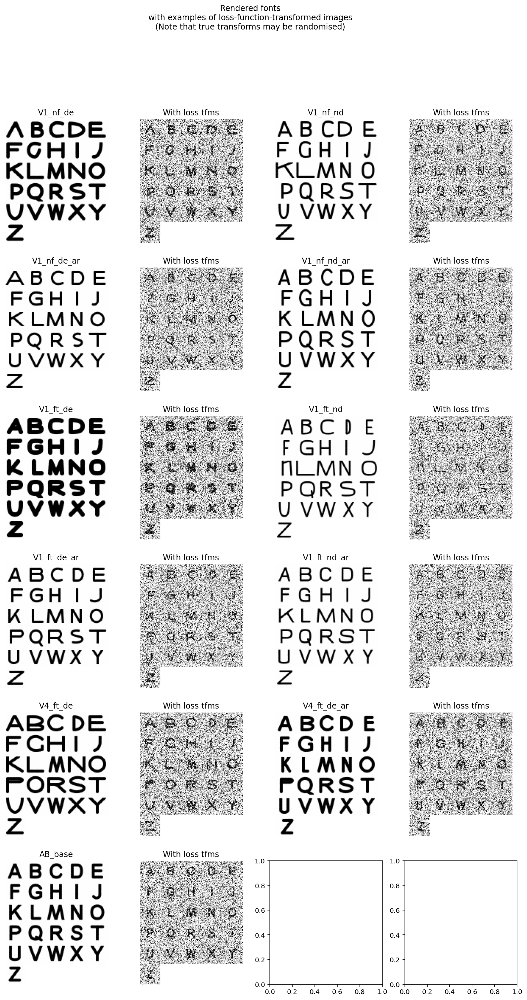

In [72]:
best_res = [{**r["Best Result"][0], "label": r.Label} for _,r in all_variations.iterrows()]
_ = show_variation_renders(
    best_res[1:] + best_res[:1], 
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(), 
    sort_by_loss=False,
    label_col="label",
    dpi=144,
    )

Renders without transformations.

In [12]:
# best_res = [{**r["Best Result"][0], "label": r.Label} for _,r in all_variations.iterrows()]

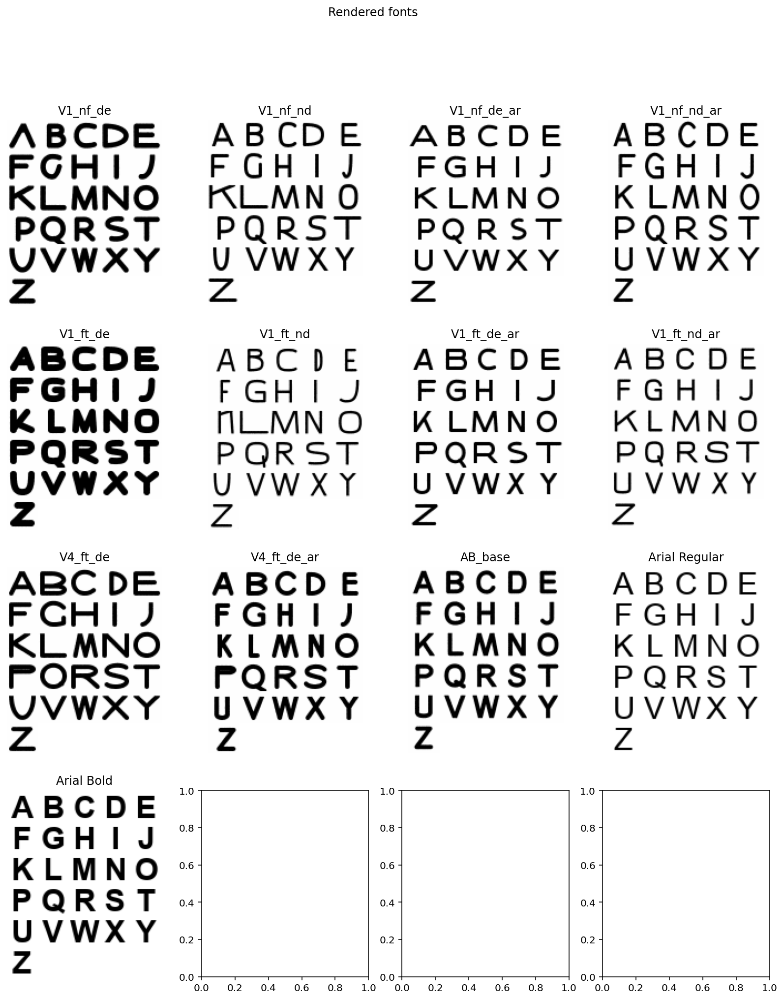

In [13]:
ocr_fns = {"V1 not finetuned": NONFINETUNED_OCR_MODEL_FN, 
            "V1 finetuned":     FINETUNED_OCR_MODEL_ALT_FN, 
            "V4 finetuned":     FINETUNED_OCR_MODEL_FN }
tfms = ACC_50_TFMS
font_size = 1.5 # For Arial
font_y = 25/28  # For Arial
iters = 100,
param_col = "final_params"
label_col = "label"
dfs = {}
dfs["Arial Regular"] = get_font_df(font_size=font_size, font_y=font_y)
dfs["Arial Bold"]    = get_font_df([SYS_FONT_PATH/"Arial Bold.ttf"], font_size=font_size, font_y=font_y)
arial_res = [dict(label=k, no_rerender=True, final_loss=0., img=df_to_image_grid(v, invert=True)) for k,v in dfs.items()]

_ = show_variation_renders(
    best_res[1:] + best_res[:1] + arial_res, 
    n=99,
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(), 
    sort_by_loss=False,
    label_col="label",
    dpi=144,
    )

#### Renders of the best variations for each of the four degradation conditions.

In [28]:
best_res = [{**r["Best Result"][0], "label": r.Label} for _,r in all_variations.iterrows()]
best_res_tmp = best_res[1:] + best_res[:1]

Default: V1_nf_de_ar

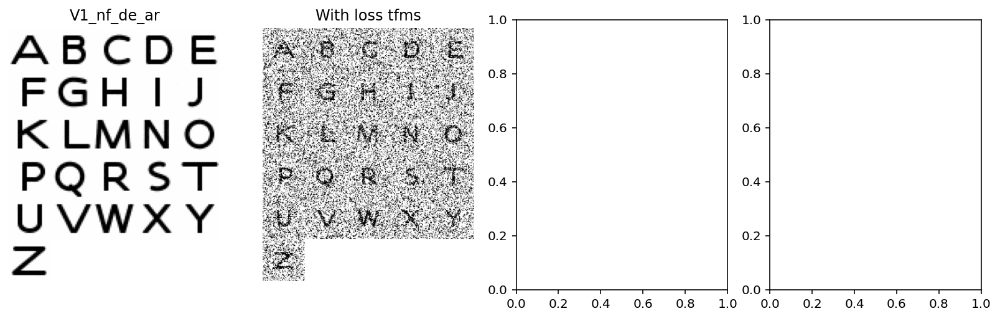

In [32]:
tfms = {**ACC_50_TFMS}
_ = show_variation_renders(
    [best_res_tmp[2]],
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(tfms=tfms), 
    sort_by_loss=False,
    label_col="label",
    dpi=144,
    show_title=False
    )

Noise +50%: V1_ft_de

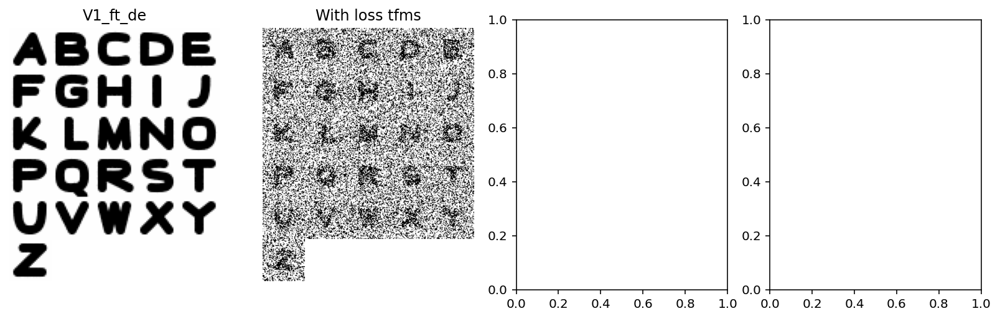

In [35]:
tfms = {**ACC_50_TFMS}
tfms["noise_f"] *= 1.5
_ = show_variation_renders(
    [best_res_tmp[4]], 
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(tfms=tfms), 
    sort_by_loss=False,
    label_col="label",
    dpi=144,
    show_title=False
    )

Noise -50%: V1_nf_de_ar

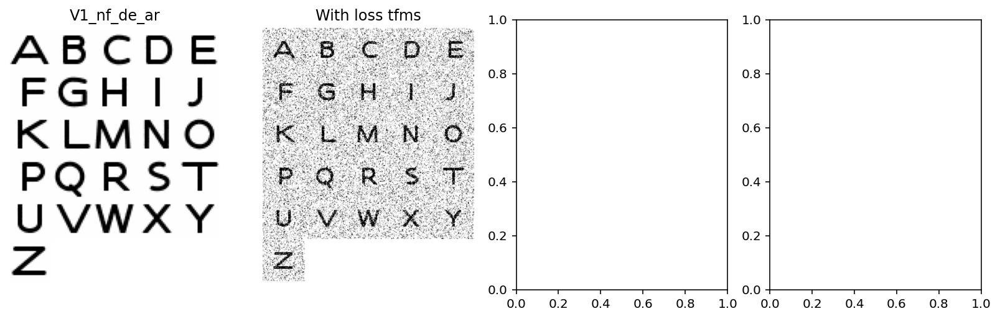

In [36]:
tfms = {**ACC_50_TFMS}
tfms["noise_f"] *= .5
_ = show_variation_renders(
    [best_res_tmp[2]], 
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(tfms=tfms), 
    sort_by_loss=False,
    label_col="label",
    dpi=144,
    show_title=False
    )

Blur: V1_ft_de

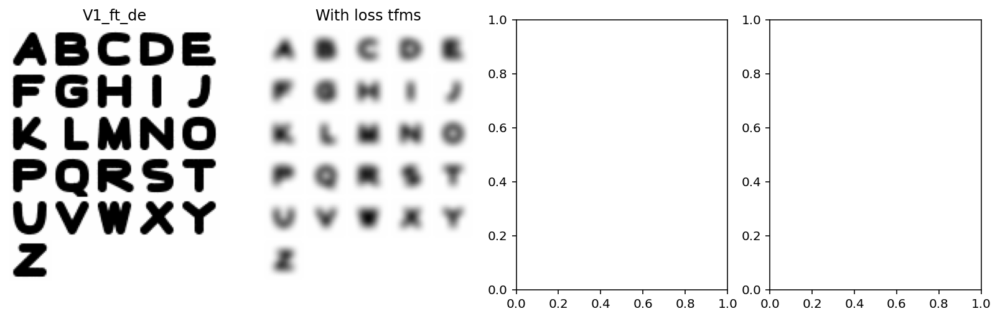

In [37]:
tfms = {**ACC_50_TFMS}
tfms["noise_f"] = None
tfms["blur_size"]  = 17
tfms["blur_sigma"] = 4.5
_ = show_variation_renders(
    [best_res_tmp[4]], 
    incl_tfms=True, 
    rerender=True,
    learner=get_learner(tfms=tfms), 
    sort_by_loss=False,
    label_col="label",
    dpi=144,
    show_title=False
    )

#### Iteration Renders

Let's first load all the iterations without filtering by output probs.

In [12]:
cols = ["Label", "Results", "OCR Model", "Degradation", "Initialisation"]
unfiltered_vars = [
    "AB_base",     _vars("v5base", filter=False), "N/A",        "N/A",          "From Arial Bold",
    "V1_nf_de",    _vars("v4a", filter=False),  "v1_final",     "Degraded",     "Random inits",
    "V1_nf_nd",    _vars("v4b", filter=False),  "v1_final",     "Not degraded", "Random inits",
    "V1_nf_de_ar", _vars("v5a2", filter=False), "v1_final",     "Degraded",     "From Arial Bold",
    "V1_nf_nd_ar", _vars("v5b2", filter=False), "v1_final",     "Not degraded", "From Arial Bold",
    "V1_ft_de",    _vars("v2", filter=False),   "v1_finetuned", "Degraded",     "Random inits",
    "V1_ft_nd",    _vars("v3", filter=False),   "v1_finetuned", "Not degraded", "Random inits",
    "V1_ft_de_ar", _vars("v5c2", filter=False), "v1_finetuned", "Degraded",     "From Arial Bold",
    "V1_ft_nd_ar", _vars("v5d2", filter=False), "v1_finetuned", "Not degraded", "From Arial Bold",
    "V4_ft_de",    _vars("v1", filter=False),   "v4_finetuned", "Degraded",     "Random inits",
    "V4_ft_de_ar", _vars("v5e2", filter=False), "v4_finetuned", "Degraded",     "From Arial Bold",
]
unfiltered_vars = DataFrame(np.array(unfiltered_vars, dtype=object).reshape([-1,len(cols)]))
unfiltered_vars.columns = cols
unfiltered_vars["Variations"] = unfiltered_vars["Results"].map(lambda x: len(x))
assert unfiltered_vars.Label.nunique() == len(unfiltered_vars)
unfiltered_vars.Results.apply(lambda x: len(x))

0      1
1      6
2      6
3      4
4      4
5      6
6     18
7      4
8      4
9     21
10     4
Name: Results, dtype: int64

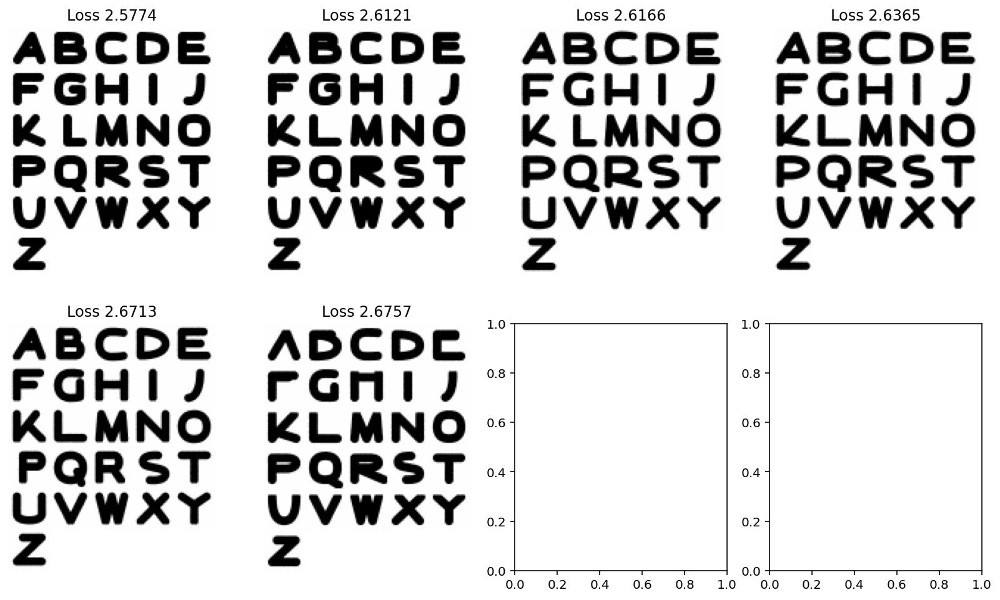

In [66]:
res_vars = unfiltered_vars[unfiltered_vars.Label == "V1_ft_de"].Results.iloc[0]
_ = show_variation_renders(
    res_vars, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(), 
    sort_by_loss=True,
    # label_col="final_loss",
    dpi=144,
    show_title=False
    )

Let's also have a look at the parameter distribution for these iterations.

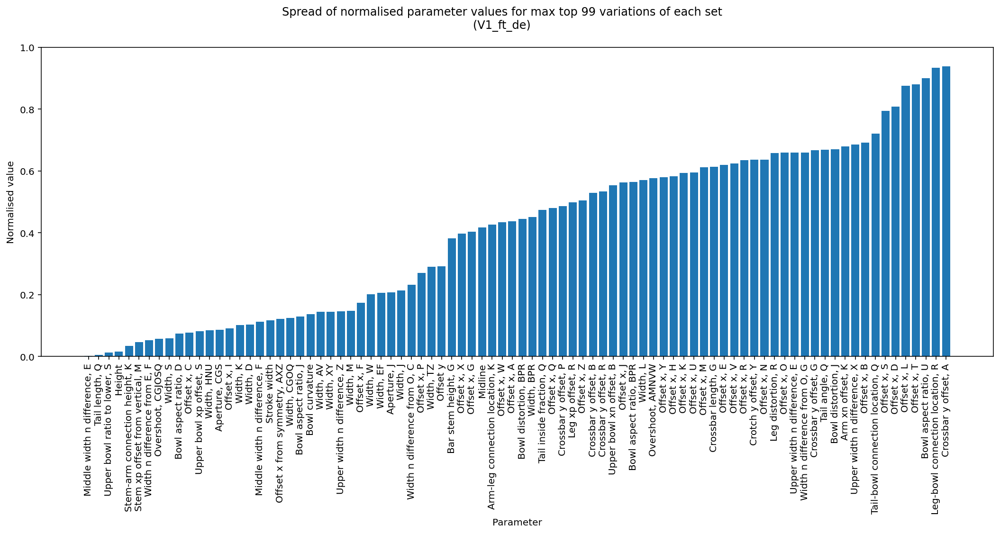

In [16]:
plot_multiple_sets_parameter_values(unfiltered_vars[unfiltered_vars.Label == "V1_ft_de"], 
                                    plot_ranges=True, plot_top_n=99, range_std=False, y_range=(0,1), sort_ranges=True)

Look at the non-finetuned model and compare the spreads between degraded and non-degraded models.

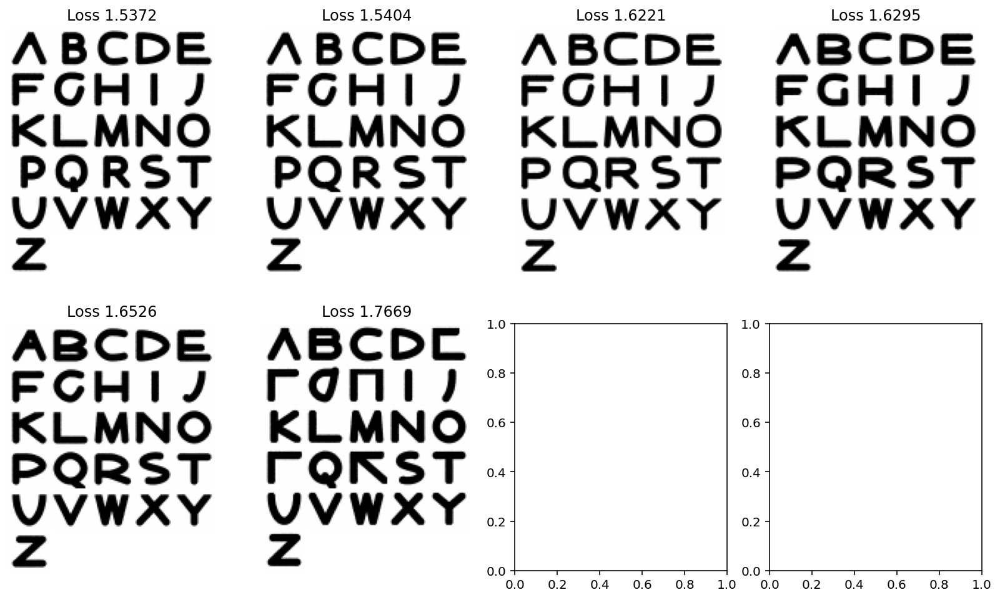

In [68]:
res_vars = unfiltered_vars[unfiltered_vars.Label == "V1_nf_de"].Results.iloc[0]
_ = show_variation_renders(
    res_vars, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(), 
    sort_by_loss=True,
    # label_col="final_loss",
    dpi=144,
    show_title=False
    )

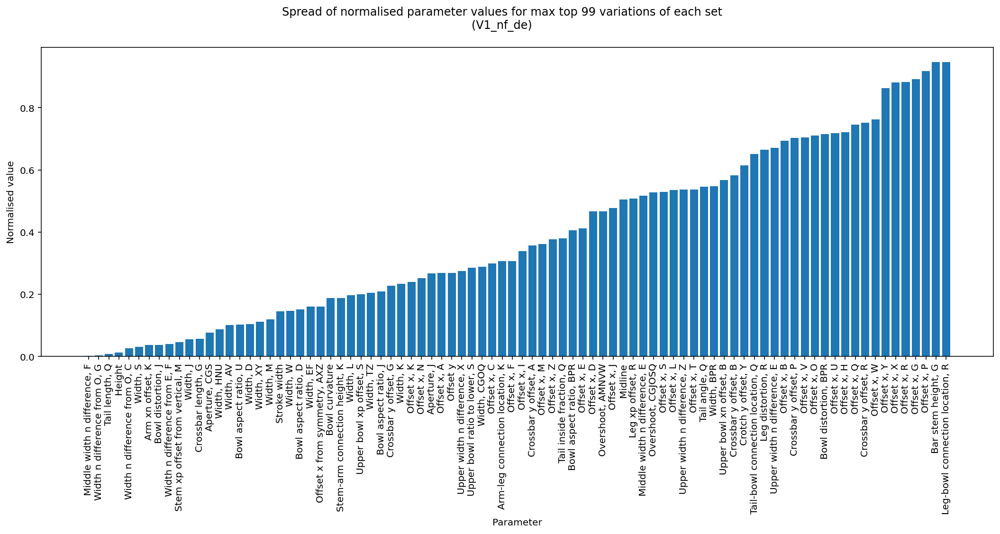

In [69]:
plot_multiple_sets_parameter_values(unfiltered_vars[unfiltered_vars.Label == "V1_nf_de"], 
                                    plot_ranges=True, plot_top_n=99, range_std=False, sort_ranges=True)

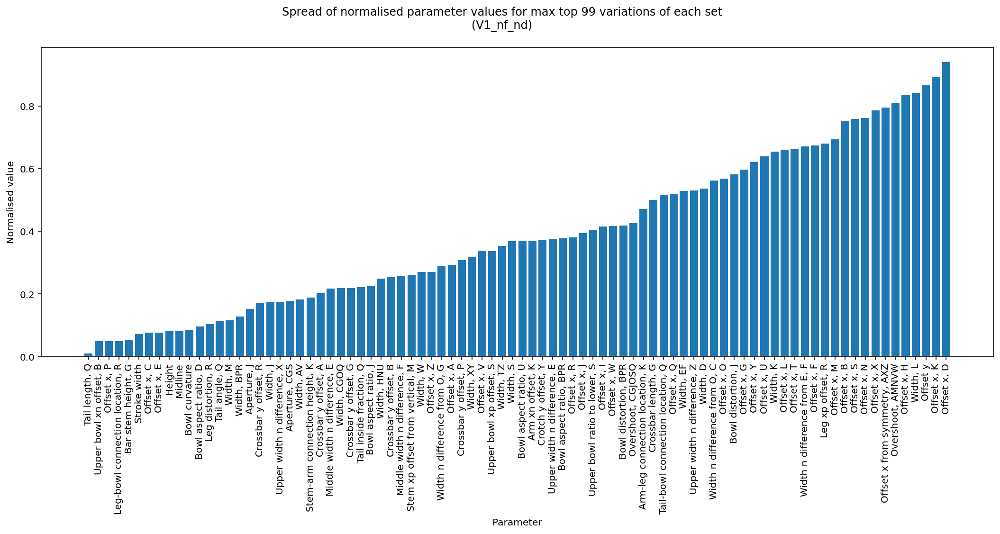

In [70]:
plot_multiple_sets_parameter_values(unfiltered_vars[unfiltered_vars.Label == "V1_nf_nd"], 
                                    plot_ranges=True, plot_top_n=99, range_std=False, sort_ranges=True)

Look at Arial-Bold-initialised fonts.

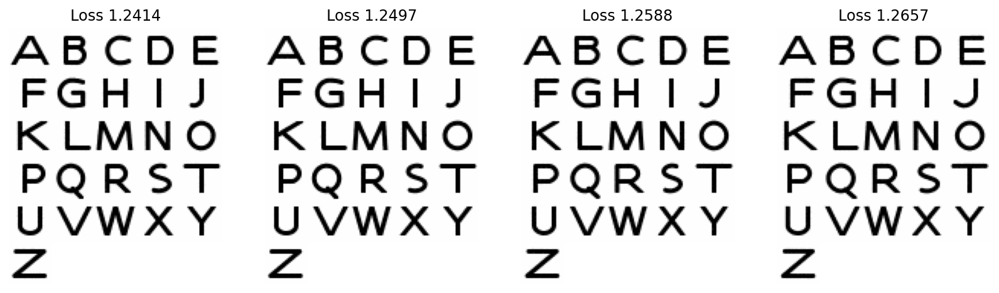

In [13]:
res_vars = unfiltered_vars[unfiltered_vars.Label == "V1_nf_de_ar"].Results.iloc[0]
_ = show_variation_renders(
    res_vars, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(), 
    sort_by_loss=True,
    # label_col="final_loss",
    dpi=144,
    show_title=False
    )

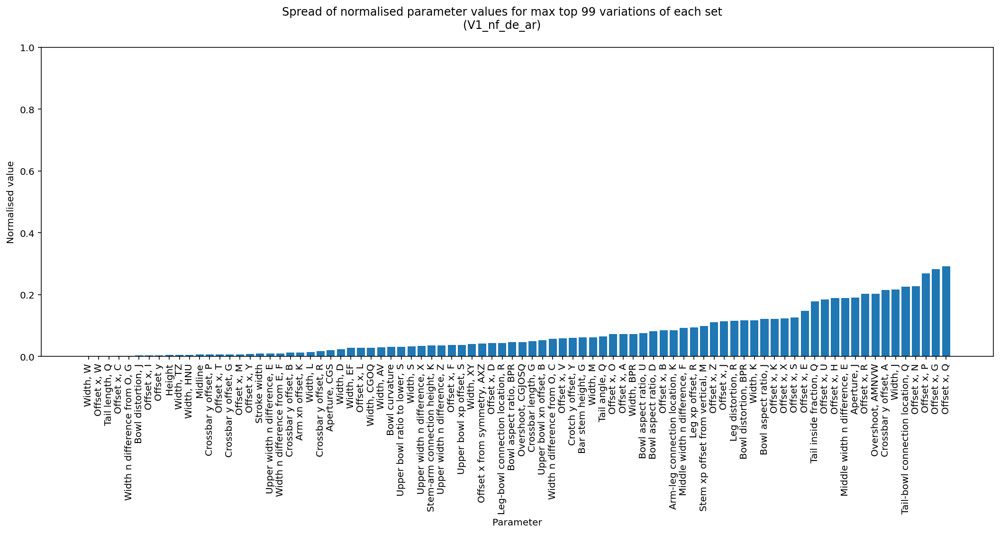

In [15]:
plot_multiple_sets_parameter_values(unfiltered_vars[unfiltered_vars.Label == "V1_nf_de_ar"], 
                                    plot_ranges=True, plot_top_n=99, range_std=False, y_range=(0., 1.), sort_ranges=True)

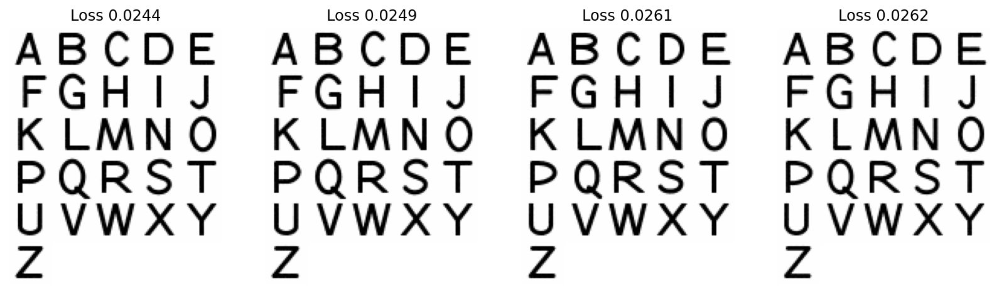

In [17]:
res_vars = unfiltered_vars[unfiltered_vars.Label == "V1_nf_nd_ar"].Results.iloc[0]
_ = show_variation_renders(
    res_vars, 
    incl_tfms=False, 
    rerender=True,
    learner=get_learner(), 
    sort_by_loss=True,
    # label_col="final_loss",
    dpi=144,
    show_title=False
    )

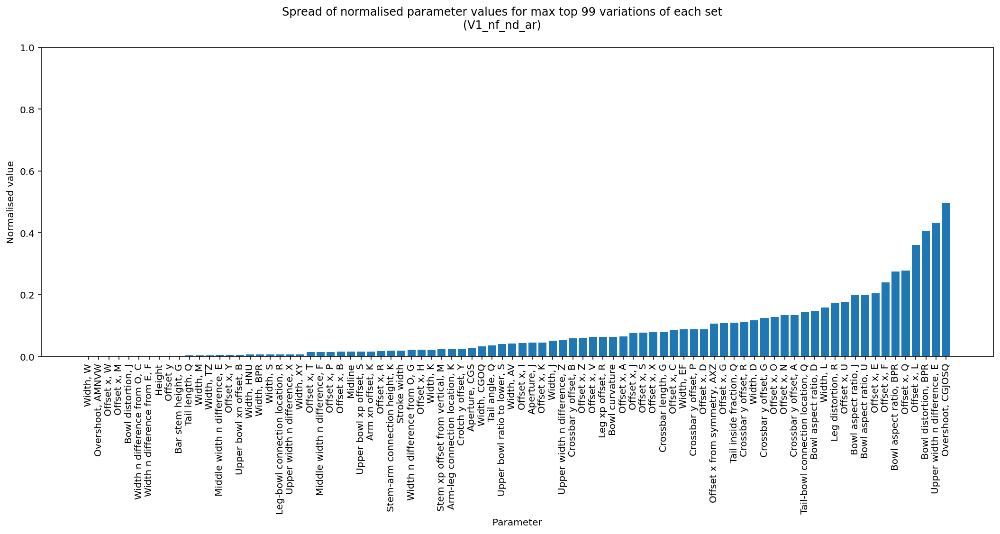

In [18]:
plot_multiple_sets_parameter_values(unfiltered_vars[unfiltered_vars.Label == "V1_nf_nd_ar"], 
                                    plot_ranges=True, plot_top_n=99, range_std=False, y_range=(0., 1.), sort_ranges=True)

### Step 6.2: Compare Accuracies to Arial (Bold)

Arial is a representative of a legible font and quite similar to the one used in the Van der Heijden study. We'll compare the correct logit propabilities and accuracies of the results from the earlier experiments to that of Arial and Arial Bold.

We're using 7 different variations of resulting fonts and both Arial Regular and Bold for comparison. For calculating the propability/accuracy, a variety of different OCR model and degradation combinations is used. Some of these match the settings used to optimise tome of the fonts.

> See a nicer Google Sheet of the results in the Visualisations folder.

> Maybe comparing accuracies is not the best method because that may mask big differences in losses.

In [13]:
def _add_label_cols(df):
    df = df.copy()
    df["Type"]        = ["AI Font" if o.startswith("AI") else o for o in df.index]
    df["OCR base"]    = ["—" if o.startswith("Arial") or o.find("AB_base") > -1 else "V1" if o.find("V1") > -1 else "V4" for o in df.index]
    df["Finetuning"]  = ["—" if o.startswith("Arial") or o.find("AB_base") > -1 else "finetuned" if o.find("_ft") > -1 else "—" for o in df.index]
    df["Degradation"] = ["—" if o.startswith("Arial") or o.find("AB_base") > -1 else "degraded" if o.find("_de") > -1 else "—" for o in df.index]
    df["Init"]        = ["—" if o.startswith("Arial") else "~Arial Bold" if o.find("_ar") > -1 or o.find("AB_base") > -1 else "random" for o in df.index]
    cols = df.columns.tolist()
    cols = cols[-5:] + cols[:-5]
    df = df[cols]
    df.reset_index(drop=True, inplace=True)
    return df

accs_fp = DUMP_FOLDER/"e3_accuracy_comparisons_all.pkl"
best_res = [{**r["Best Result"][0], "label": r.Label} for _,r in all_variations.iterrows()]
# Either recalculate or use saved results by switching comments
# df_images,accs_df = compare_accuracies(best_res); dump(accs_df,accs_fp)
accs_df = load(accs_fp); warn("Using saved statistics!")

prob_means_df = accs_df.applymap(lambda x: x[0])
acc_means_df  = accs_df.applymap(lambda x: x[2].item())
_add_label_cols(prob_means_df)

/var/folders/3p/10hbv0415234v3x5ctp50l4m0000gn/T/ipykernel_26758/29893189.py:18: UserWarning: Using saved statistics!
  accs_df = load(accs_fp); warn("Using saved statistics!")


,Type,OCR base,Finetuning,Degradation,Init,V1 not finetuned: default,V1 not finetuned: noise +50%,V1 not finetuned: noise –50%,V1 not finetuned: blur,V1 finetuned: default,V1 finetuned: noise +50%,V1 finetuned: noise –50%,V1 finetuned: blur,V4 finetuned: default,V4 finetuned: noise +50%,V4 finetuned: noise –50%,V4 finetuned: blur
0,Arial Regular,—,—,—,—,0.677336,0.281107,0.877596,0.103709,0.389859,0.150247,0.585479,0.052113,0.392323,0.145777,0.566640,0.047415
1,Arial Bold,—,—,—,—,0.707811,0.345029,0.878978,0.106475,0.403074,0.182838,0.554966,0.059302,0.458429,0.198092,0.612885,0.063931
2,AI Font,—,—,—,~Arial Bold,0.689552,0.343053,0.879974,0.099742,0.405150,0.183841,0.551640,0.058799,0.465208,0.201347,0.623297,0.062199
3,AI Font,V1,—,degraded,random,0.735348,0.397228,0.877823,0.184555,0.426709,0.208326,0.542267,0.070407,0.416419,0.196940,0.559614,0.083581
4,AI Font,V1,—,—,random,0.721165,0.328721,0.908877,0.137602,0.424125,0.174008,0.587112,0.058280,0.406778,0.165451,0.553813,0.054853
5,AI Font,V1,—,degraded,~Arial Bold,0.827381,0.432882,0.961714,0.126838,0.495355,0.207492,0.654081,0.057967,0.473050,0.196697,0.616755,0.050557
6,AI Font,V1,—,—,~Arial Bold,0.763219,0.355968,0.933539,0.109883,0.464274,0.189489,0.645248,0.054804,0.467699,0.184821,0.626253,0.051287
7,AI Font,V1,finetuned,degraded,random,0.708483,0.377145,0.866179,0.129836,0.409531,0.210104,0.541909,0.074352,0.379858,0.175618,0.522390,0.101304
8,AI Font,V1,finetuned,—,random,0.574745,0.236296,0.772678,0.101160,0.339957,0.132661,0.529839,0.054311,0.334795,0.128062,0.483162,0.047232
9,AI Font,V1,finetuned,degraded,~Arial Bold,0.751953,0.367898,0.919247,0.098700,0.467504,0.195016,0.651447,0.058907,0.457344,0.187216,0.604835,0.053103


Percent of best of propability condition. Best variants highlighted.

In [46]:
prob_means_pctg_df = (prob_means_df / prob_means_df.max()).applymap(lambda x: f"{x:.0%}" if type(x) is float else x)
prob_best_df = prob_means_pctg_df.applymap(lambda x: "BEST" if x == "100%" else x)
_add_label_cols(prob_best_df)

,Type,OCR base,Finetuning,Degradation,Init,V1 not finetuned: default,V1 not finetuned: noise +50%,V1 not finetuned: noise –50%,V1 not finetuned: blur,V1 finetuned: default,V1 finetuned: noise +50%,V1 finetuned: noise –50%,V1 finetuned: blur,V4 finetuned: default,V4 finetuned: noise +50%,V4 finetuned: noise –50%,V4 finetuned: blur
0,Arial Regular,—,—,—,—,82%,65%,91%,56%,79%,72%,90%,70%,83%,72%,90%,47%
1,Arial Bold,—,—,—,—,86%,80%,91%,58%,81%,87%,85%,80%,97%,98%,98%,63%
2,AI Font,—,—,—,~Arial Bold,83%,79%,92%,54%,82%,87%,84%,79%,98%,BEST,BEST,61%
3,AI Font,V1,—,degraded,random,89%,92%,91%,BEST,86%,99%,83%,95%,88%,98%,89%,83%
4,AI Font,V1,—,—,random,87%,76%,95%,75%,86%,83%,90%,78%,86%,82%,88%,54%
5,AI Font,V1,—,degraded,~Arial Bold,BEST,BEST,BEST,69%,BEST,99%,BEST,78%,BEST,98%,98%,50%
6,AI Font,V1,—,—,~Arial Bold,92%,82%,97%,60%,94%,90%,99%,74%,99%,92%,BEST,51%
7,AI Font,V1,finetuned,degraded,random,86%,87%,90%,70%,83%,BEST,83%,BEST,80%,87%,83%,BEST
8,AI Font,V1,finetuned,—,random,69%,55%,80%,55%,69%,63%,81%,73%,71%,64%,77%,47%
9,AI Font,V1,finetuned,degraded,~Arial Bold,91%,85%,96%,53%,94%,93%,BEST,79%,97%,93%,97%,52%


Percent of best of accuracy condition. Best variants highlighted.

> We should probably not look at accuracy that much, as the whole premise for analysis has been equating logit propability with human accuracy.

In [47]:
acc_means_pctg_df = (acc_means_df / acc_means_df.max()).applymap(lambda x: f"{x:.0%}" if type(x) is float else x)
acc_best_df = acc_means_pctg_df.applymap(lambda x: "BEST" if x == "100%" else x)
_add_label_cols(acc_best_df)

,Type,OCR base,Finetuning,Degradation,Init,V1 not finetuned: default,V1 not finetuned: noise +50%,V1 not finetuned: noise –50%,V1 not finetuned: blur,V1 finetuned: default,V1 finetuned: noise +50%,V1 finetuned: noise –50%,V1 finetuned: blur,V4 finetuned: default,V4 finetuned: noise +50%,V4 finetuned: noise –50%,V4 finetuned: blur
0,Arial Regular,—,—,—,—,88%,72%,93%,50%,93%,79%,96%,75%,93%,74%,94%,25%
1,Arial Bold,—,—,—,—,91%,85%,93%,50%,94%,92%,93%,50%,98%,BEST,BEST,50%
2,AI Font,—,—,—,~Arial Bold,89%,83%,94%,37%,95%,91%,94%,25%,98%,BEST,99%,50%
3,AI Font,V1,—,degraded,random,92%,89%,92%,88%,93%,99%,91%,BEST,93%,92%,98%,75%
4,AI Font,V1,—,—,random,92%,79%,96%,BEST,95%,86%,97%,BEST,92%,82%,95%,25%
5,AI Font,V1,—,degraded,~Arial Bold,BEST,BEST,BEST,75%,BEST,99%,96%,BEST,BEST,97%,BEST,25%
6,AI Font,V1,—,—,~Arial Bold,96%,89%,98%,75%,99%,93%,BEST,75%,98%,90%,BEST,25%
7,AI Font,V1,finetuned,degraded,random,90%,87%,93%,50%,91%,BEST,92%,75%,87%,88%,94%,BEST
8,AI Font,V1,finetuned,—,random,76%,60%,83%,62%,80%,66%,85%,BEST,79%,63%,83%,25%
9,AI Font,V1,finetuned,degraded,~Arial Bold,94%,88%,97%,75%,99%,95%,BEST,BEST,97%,93%,99%,25%


Propabilities for the V1 versions only.

In [48]:
prob_means_v1_df = accs_df.applymap(lambda x: x[0])
prob_means_v1_df.drop(columns=[o for o in prob_means_v1_df.columns.tolist() if o.startswith("V4")], inplace=True)
prob_means_v1_df.drop(index=[o for o in prob_means_v1_df.index if o.find("V4") > -1], inplace=True)
prob_means_v1_pctg_df = (prob_means_v1_df / prob_means_v1_df.max()).applymap(lambda x: f"{x:.0%}" if type(x) is float else x)
prob_means_v1_df = prob_means_v1_df.applymap(lambda x: f"{x:.2f} • ") + prob_means_v1_pctg_df
_add_label_cols(prob_means_v1_df)


,Type,OCR base,Finetuning,Degradation,Init,V1 not finetuned: default,V1 not finetuned: noise +50%,V1 not finetuned: noise –50%,V1 not finetuned: blur,V1 finetuned: default,V1 finetuned: noise +50%,V1 finetuned: noise –50%,V1 finetuned: blur
0,Arial Regular,—,—,—,—,0.68 • 82%,0.28 • 65%,0.88 • 91%,0.10 • 56%,0.39 • 79%,0.15 • 72%,0.59 • 90%,0.05 • 70%
1,Arial Bold,—,—,—,—,0.71 • 86%,0.35 • 80%,0.88 • 91%,0.11 • 58%,0.40 • 81%,0.18 • 87%,0.55 • 85%,0.06 • 80%
2,AI Font,—,—,—,~Arial Bold,0.69 • 83%,0.34 • 79%,0.88 • 92%,0.10 • 54%,0.41 • 82%,0.18 • 87%,0.55 • 84%,0.06 • 79%
3,AI Font,V1,—,degraded,random,0.74 • 89%,0.40 • 92%,0.88 • 91%,0.18 • 100%,0.43 • 86%,0.21 • 99%,0.54 • 83%,0.07 • 95%
4,AI Font,V1,—,—,random,0.72 • 87%,0.33 • 76%,0.91 • 95%,0.14 • 75%,0.42 • 86%,0.17 • 83%,0.59 • 90%,0.06 • 78%
5,AI Font,V1,—,degraded,~Arial Bold,0.83 • 100%,0.43 • 100%,0.96 • 100%,0.13 • 69%,0.50 • 100%,0.21 • 99%,0.65 • 100%,0.06 • 78%
6,AI Font,V1,—,—,~Arial Bold,0.76 • 92%,0.36 • 82%,0.93 • 97%,0.11 • 60%,0.46 • 94%,0.19 • 90%,0.65 • 99%,0.05 • 74%
7,AI Font,V1,finetuned,degraded,random,0.71 • 86%,0.38 • 87%,0.87 • 90%,0.13 • 70%,0.41 • 83%,0.21 • 100%,0.54 • 83%,0.07 • 100%
8,AI Font,V1,finetuned,—,random,0.57 • 69%,0.24 • 55%,0.77 • 80%,0.10 • 55%,0.34 • 69%,0.13 • 63%,0.53 • 81%,0.05 • 73%
9,AI Font,V1,finetuned,degraded,~Arial Bold,0.75 • 91%,0.37 • 85%,0.92 • 96%,0.10 • 53%,0.47 • 94%,0.20 • 93%,0.65 • 100%,0.06 • 79%


Hierarchically organised table.

In [49]:
df = accs_df.applymap(lambda x: x[0])
# df.drop(columns=[o for o in df.columns.tolist() if o.startswith("V4")], inplace=True)
# df.drop(index=[o for o in df.index if o.find("V4") > -1], inplace=True)
df = _add_label_cols(df)
# Process
index_cols = ["Type", "OCR base", "Finetuning", "Degradation", "Init"]
hier_cols = DataFrame(
    [
     ["V1", "—",         "default"],
     ["V1", "—",         "noise +50%"],
     ["V1", "—",         "noise –50%"],
     ["V1", "—",         "blur"],
     ["V1", "finetuned", "default"],
     ["V1", "finetuned", "noise +50%"],
     ["V1", "finetuned", "noise –50%"],
     ["V1", "finetuned", "blur"],
     ["V4", "finetuned", "default"],
     ["V4", "finetuned", "noise +50%"],
     ["V4", "finetuned", "noise –50%"],
     ["V4", "finetuned", "blur"],
    ],
    columns=["OCR base", "Finetuning", "Degradation"]
    )
df.index   = pd.MultiIndex.from_frame(df[index_cols])
df.drop(columns=index_cols, inplace=True) # index_cols + ["OCR base"]
df.columns = pd.MultiIndex.from_frame(hier_cols)
# df.sort_values(by=index_cols, inplace=True)
df

OCR base                                                         V1  \
Finetuning                                                        —   
Degradation                                                 default   
Type          OCR base Finetuning Degradation Init                    
Arial Regular —        —          —           —            0.677336   
Arial Bold    —        —          —           —            0.707811   
AI Font       —        —          —           ~Arial Bold  0.689552   
              V1       —          degraded    random       0.735348   
                                  —           random       0.721165   
                                  degraded    ~Arial Bold  0.827381   
                                  —           ~Arial Bold  0.763219   
                       finetuned  degraded    random       0.708483   
                                  —           random       0.574745   
                                  degraded    ~Arial Bold  0.751953   
                                  —           ~Arial Bold  0.630571   
              V4       finetuned  degraded    random       0.653552   
                                              ~Arial Bold  0.675754   

OCR base                                                              \
Finetuning                                                             
Degradation                                               noise +50%   
Type          OCR base Finetuning Degradation Init                     
Arial Regular —        —          —           —             0.281107   
Arial Bold    —        —          —           —             0.345029   
AI Font       —        —          —           ~Arial Bold   0.343053   
              V1       —          degraded    random        0.397228   
                                  —           random        0.328721   
                                  degraded    ~Arial Bold   0.432882   
                                  —           ~Arial Bold   0.355968   
                       finetuned  degraded    random        0.377145   
                                  —           random        0.236296   
                                  degraded    ~Arial Bold   0.367898   
                                  —           ~Arial Bold   0.245343   
              V4       finetuned  degraded    random        0.338866   
                                              ~Arial Bold   0.340023   

OCR base                                                              \
Finetuning                                                             
Degradation                                               noise –50%   
Type          OCR base Finetuning Degradation Init                     
Arial Regular —        —          —           —             0.877596   
Arial Bold    —        —          —           —             0.878978   
AI Font       —        —          —           ~Arial Bold   0.879974   
              V1       —          degraded    random        0.877823   
                                  —           random        0.908877   
                                  degraded    ~Arial Bold   0.961714   
                                  —           ~Arial Bold   0.933539   
                       finetuned  degraded    random        0.866179   
                                  —           random        0.772678   
                                  degraded    ~Arial Bold   0.919247   
                                  —           ~Arial Bold   0.873306   
              V4       finetuned  degraded    random        0.805417   
                                              ~Arial Bold   0.848303   

OCR base                                                                       \
Finetuning                                                          finetuned   
Degradation                                                    blur   default   
Type          OCR base Finetuning Degradation Init                              
Arial Regular —   

Styled table for export.

In [50]:
dfs = df.style.format("{:.1%}")
for c in df.columns:
    vmin,vmax = df[c].min(),df[c].max()
    dfs = dfs.bar(subset=[c], vmin=vmin, vmax=vmax,
                  align="mid", color="blue", width=30, height=14,
                  props="width: 10em; padding-right: 2em; text-align: right;")
def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
dfs.apply(highlight_max, props="font-weight: bold; color: red;", axis=0)
dfs

Export the table.

In [51]:
fn_stem = "e3_mean_probs_styled"
dfs.to_html(DUMP_FOLDER/f"{fn_stem}.html")
dfs.to_excel(DUMP_FOLDER/f"{fn_stem}.xlsx")

### Step 6.3: Look at Some Letter-Level Accuracies

Compare the accuracies of V1_nf_de and V1_ft_de in the V1-ft default condition.

In [25]:
comp_df = DataFrame([accs_df["V1 finetuned: default"]["AI Font: V1_nf_de"][1]] + 
                    [accs_df["V1 finetuned: default"]["AI Font: V1_ft_de"][1]],
                    index=["AI Font: V1_nf_de","AI Font: V1_ft_de"])
# comp_df = comp_df.T
comp_df.T

,AI Font: V1_nf_de,AI Font: V1_ft_de
A,0.481181,0.672105
B,0.389504,0.301468
C,0.802951,0.720742
D,0.182295,0.255206
E,0.242055,0.208523
F,0.260739,0.228586
G,0.235618,0.373416
H,0.344393,0.350818
I,0.413359,0.444454
J,0.585112,0.621098


### Step 6.4: Compare V1 Non-Finetuned and Finetuned Arial Inits

It's rather strange that the non-finetuned Arial-Bold-initialised version overperforms the finetuned one even when evalueted with the finetuned model.

Let's look at the per-class probabilities.

Text(0.5, 0.98, 'Difference in correct class output probability between\nV1 non-fine-tuned and V1 fine-tuned, degraded, Arial-Bold-initialised fonts')

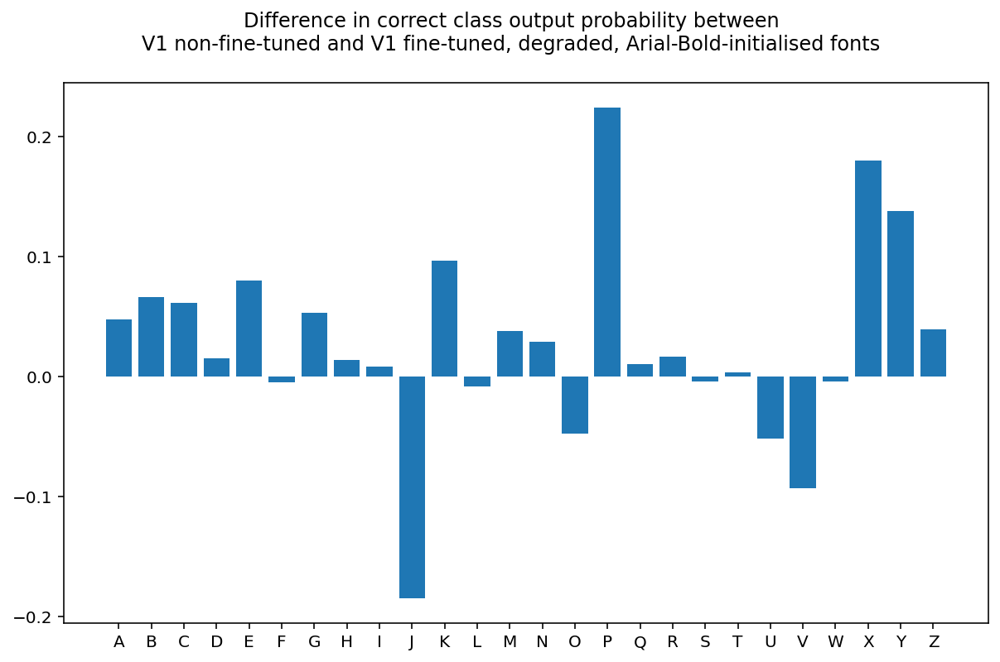

In [71]:
# (prob_mean,prob_dict,acc_mean,acc_dict)
prob_col = "V1 finetuned: default"
prob_nf = accs_df.iloc[5][prob_col][1] # V1_nf_de_ar
prob_ft = accs_df.iloc[9][prob_col][1] # V1_ft_de_ar
cfm = get_empirical_confusion_matrix()
fig = plt.figure(figsize=(10,6))
ax  = plt.gca()
# ax.plot(prob_nf.keys(), prob_nf.values(), label="V1 not finetuned, degraded, ~Arial Bold")
# ax.plot(prob_ft.keys(), prob_ft.values(), label="V1 finetuned, degraded, ~Arial Bold")
ax.bar(prob_ft.keys(), np.array(list(prob_nf.values())) - np.array(list(prob_ft.values())), label="V1 non-finetuned less V1 finetuned")
# ax.scatter(prob_ft.keys(), np.diag(cfm), label="Accuracy in confusion matrix")
# ax.legend()
fig.suptitle(f"Difference in correct class output probability between\nV1 non-fine-tuned and V1 fine-tuned, degraded, Arial-Bold-initialised fonts")

> There's not much we can tell from the loss spreads.

### Step 6.5: Train the V1 Non-Finetuned Further With the Finetuned Model

Let's see if the finetuned model somehow guides optimisation to suboptimal results.

To do that we'll train the V1 non-finetuned font using the finetuned OCR model.

The correct class probability for the model was 0.495355, whilst the finetuned-trained one's was 0.467504.

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2833: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


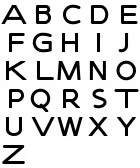

In [19]:
ft_results = []
best_res_df = DataFrame(best_res)
initial_params = best_res_df[best_res_df.label == "V1_nf_de_ar"].iloc[0].final_params
# runs = [(200, .06), (100, .02)]
learner_args = dict(
    ocr_fn=FINETUNED_OCR_MODEL_ALT_FN,
    tfms=ACC_50_TFMS,
)
learn = get_learner(**learner_args)
learn.load_param_dict(initial_params)
learn.render_letters()

In [20]:
learn.fit_one_cycle(100, .02)

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastprogress/fastprogress.py:74: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


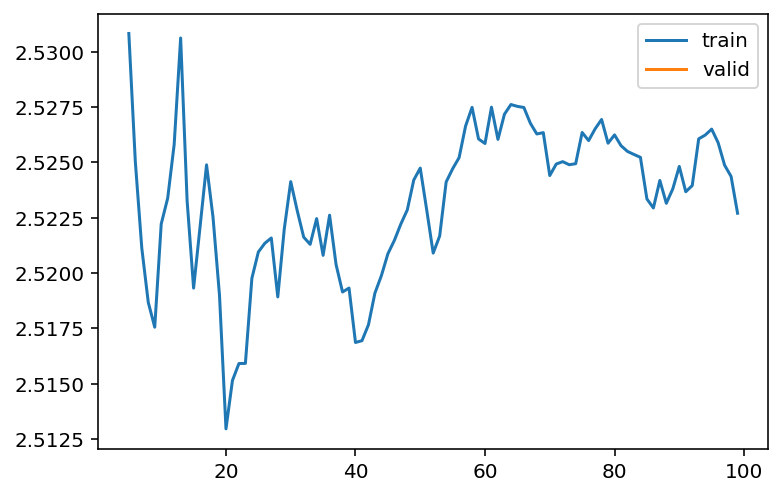

In [21]:
learn.recorder.plot_loss()

In [28]:
learn.recorder.losses[-1].item()

2.5226964950561523

In [30]:
params = learn.get_param_dict()
acc = get_accuracy(params)
ft_results.append(dict(
    training=[(100, .02)],
    params=params,
    loss=learn.recorder.losses[-1].item(),
    correct_probability=acc
))
print(f"Correct probability: {acc:0.6f} • Compare to: 0.495355")

Correct probability: 0.492772 • Compare to: 0.495355


Let's do one more training session.

Correct probability: 0.480218 • Compare to: 0.495355


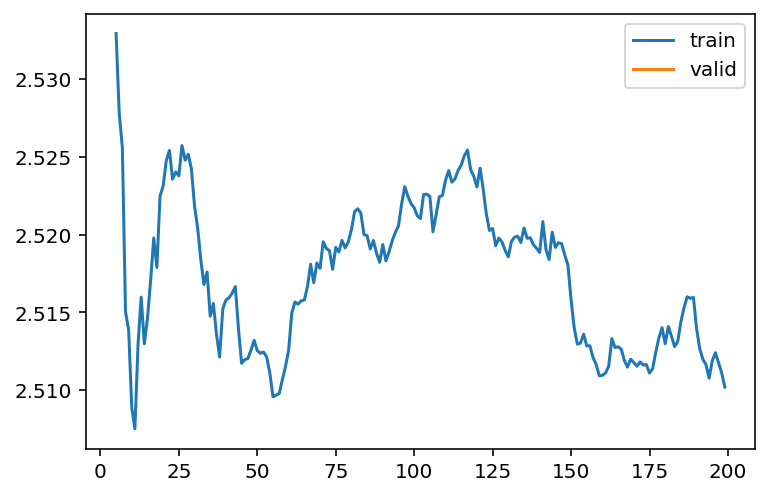

In [33]:
learn = get_learner(**learner_args)
learn.load_param_dict(initial_params)
learn.fit_one_cycle(200, .06)
clear()
learn.recorder.plot_loss()
params = learn.get_param_dict()
acc = get_accuracy(params)
ft_results.append(dict(
    training=[(200, .06)],
    params=params,
    loss=learn.recorder.losses[-1].item(),
    correct_probability=acc
))
print(f"Correct probability: {acc:0.6f} • Compare to: 0.495355")

Let'see whether the font keeps deteriorating if we train further.

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2833: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


Correct probability: 0.484232 • Compare to: 0.495355


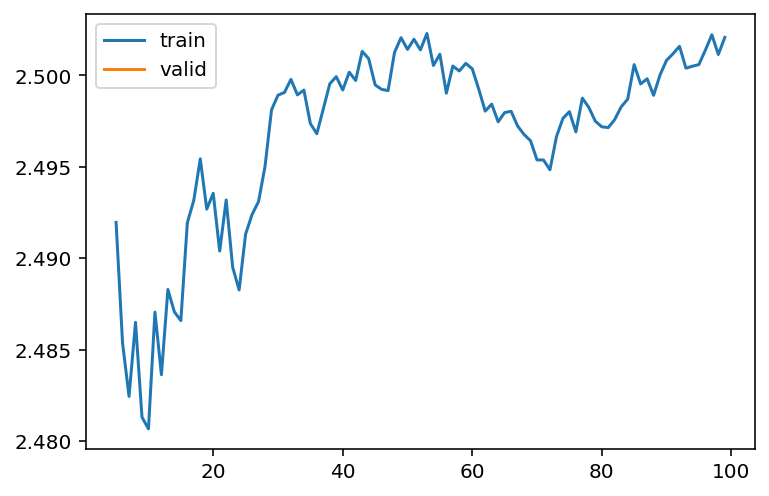

In [34]:
learn.fit_one_cycle(100, .02)
clear()
learn.recorder.plot_loss()
params = learn.get_param_dict()
acc = get_accuracy(params)
ft_results.append(dict(
    training=[(200, .06),(100, .02)],
    params=params,
    loss=learn.recorder.losses[-1].item(),
    correct_probability=acc
))
print(f"Correct probability: {acc:0.6f} • Compare to: 0.495355")

> Nothing conclusive to say except that it seems the lower learning rates seem to work better.

### Step 6.6: Redo v5c2 to See If Its Low Performance Was a Random Event

In [37]:
initial_params = load(ARIAL_BOLD_PARAMS_PATH)
# Clamp within -4.,4.
for k,v in initial_params.items():
    if abs(v) > 4.: initial_params[k] = 4. if v > 0. else -4.
arial_bold_res = [dict(initial_params=initial_params)]
arial_n_vars = 3
runs = [(200, .06), (100, .02)]
ocr_fn=FINETUNED_OCR_MODEL_ALT_FN
v = "v5c3"
res_v5c3 = create_and_optimise_variations(v, init_res=arial_bold_res, variations=arial_n_vars, 
                                          max_init_loss=None, runs=runs, ocr_fn=ocr_fn)

Merge loss improvement: -0.03572 • 2.446 => 2.482
Merge loss improvement after finetuning: 0.01491 • 2.482 => 2.467


In [38]:
res_v5c3_2 = _vars(v)
for o in res_v5c3_2: print(o["correct_probability"])

0.47052884101867676
0.4677293002605438
0.4663501977920532
0.46082961559295654


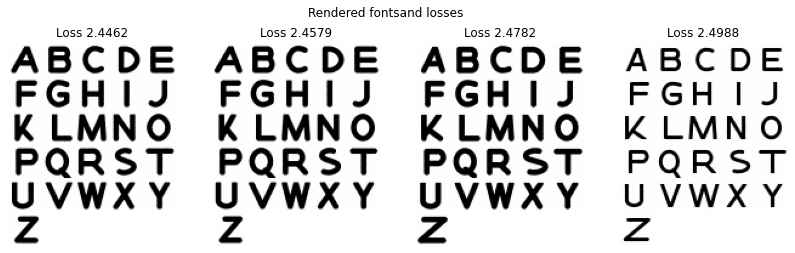

In [43]:
learner=get_learner(tfms=NO_TFMS)
_ = show_variation_renders(res_v5c3_2, incl_tfms=False, rerender=True, learner=learner)

The previously optimised versions.

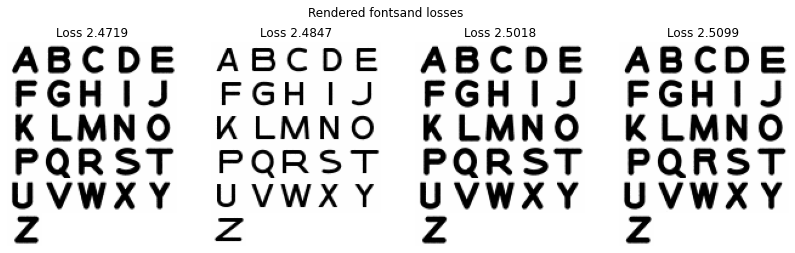

In [44]:
res_v5c2 = load(get_variations_filepath("v5c2"))
_ = show_variation_renders(res_v5c2, incl_tfms=False, rerender=True, learner=learner)

> The results are remarkably similar.

## Create SVG Files

> Create a font file from the best variant.

1. Create SVG files
2. Flatten SVGs in Illustrator
3. Import SVGs into Glyphr
4. Adjust spacing and kerning in Glyphr
5. Export Otf file from Glyphr

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2833: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


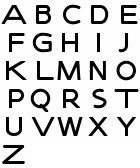

In [18]:
# best_params = all_variations[all_variations.Label == "V1_nf_de_ar"]["Best Result"].iloc[0][0]["final_params"]
# dump(best_params, BEST_VARIANT_PARAMS_PATH)
best_params = load(BEST_VARIANT_PARAMS_PATH)
learn = get_learner(ocr_fn=NONFINETUNED_OCR_MODEL_FN)
learn.load_param_dict(best_params)
learn.render_letters()

In [20]:
fp_base = DUMP_FOLDER/"e3_best_variant_"
learn.save_svg(fp_base, letter=VOCAB_UC)

Render variant E as svg as well.

/Users/kallejarvenpaa/opt/miniconda3/envs/ai-font-p3.9/lib/python3.9/site-packages/fastai/learner.py:55: UserWarning: Could not load the optimizer state.
  if with_opt: warn("Could not load the optimizer state.")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:2833: UserWarning: Using default input_shape: (28, 28)
  warn(f"Using default input_shape: {input_shape}")
/Users/kallejarvenpaa/Desktop/AI-fontti/aifont/aifont/fontlearner.py:681: UserWarning: Are you sure you want to define bs when using from_vocab?
  if x in kwargs and kwargs[x] is not None: warn(f"Are you sure you want to define {x} when using from_vocab?")


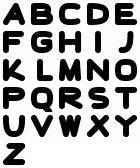

In [21]:
params = all_variations[all_variations.Label == "V1_ft_de"]["Best Result"].iloc[0][0]["final_params"]
learn = get_learner(ocr_fn=NONFINETUNED_OCR_MODEL_FN)
learn.load_param_dict(params)
display(learn.render_letters())
fp_base = DUMP_FOLDER/"e3_variant_e_"
learn.save_svg(fp_base, letter=VOCAB_UC)

## Additional Visualisations

Change dpi for export.

In [26]:
plt.rcParams['figure.dpi'] = 144

### Variations of the Letter B

In [ ]:

b_params

['Midline',
 'Stroke width',
 'Bowl curvature',
 'Width, BPR',
 'Crossbar y offset, B',
 'Bowl aspect ratio, BPR',
 'Bowl distortion, BPR',
 'Upper bowl xn offset, B',
 'Offset y',
 'Offset x, B']

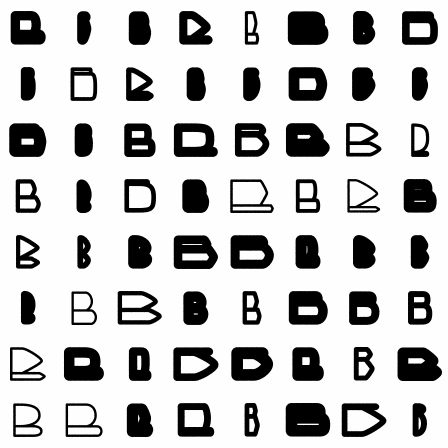

In [34]:
n_vars = 8*8
fixed_params = {
    "Height": 1.,
    # "Width, BPR": 0.5,
    # "Stroke width": -1.,
}
learn = get_learner()
learn.model.canvas_width = learn.model.canvas_height = 56

# b_params = [o for o in learn.param_names if param_affects(o, letters="B") and o not in ["Height"]]

var_imgs = []
for _ in range(n_vars):
    learn.reset_parameters()
    learn.load_param_dict(fixed_params, vocal=False)
    var_imgs.append(learn.render_letter("B"))

image_grid(var_imgs)